In [8]:
import tensorflow as tf
import importlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.utils import shuffle
import torch
from datetime import datetime
import utils4
import model2
import results_generator
importlib.reload(utils4)
importlib.reload(model2)
importlib.reload(results_generator)
from utils4 import *
from model2 import *
from results_generator import *
tf.test.is_built_with_cuda()

True

In [3]:
icon_name_category, sketch_name_category = get_icons_and_sketches()
icon_dictionary, sketch_dictionary = load_icons_sketches_dic(icon_name_category, sketch_name_category)



In [9]:
random_generation = False
if random_generation:
    positive_pairs = positive_pairs_generator(icon_name_category, sketch_name_category)
    positive_pairs = shuffle(positive_pairs)

    len_data = len(positive_pairs)
    p_train=0.9
    p_test=0.1
    num_train = int(np.ceil(len_data*p_train))
    num_test = int(np.floor(len_data*p_test))

    positive_pairs_Train = positive_pairs[:num_train]
    possible_negative_pairs_Train = possible_negative_pairs_generator(positive_pairs_Train, icon_name_category)
    triplet_pairs_Train = triplets_generator(positive_pairs_Train, icon_name_category, possible_negative_pairs_Train)
    triplet_pairs_Train = shuffle(triplet_pairs_Train)
    positive_pairs_Test = positive_pairs[-num_test:]
    sketches_Test = positive_pairs_Test[:, [0, 1]]

    icons_Test = positive_pairs_Test[:, [2, 3]]
    # create the icons test dataset by removing the dublicates of the array
    _, unique_indices = np.unique(icons_Test[:,0], return_index=True)
    unique_icons_Test = icons_Test[unique_indices]

    print(f'We have {len(triplet_pairs_Train)} samples in the training set.')
    print(f'We have {len(sketches_Test)} sketches in the test set.')
    print(f'We have {len(unique_icons_Test)} unique icons in the test set.')
else:
    sketch_name_category_Train = load_train_set()
    sketch_name_category_Test = load_test_set()

    positive_pairs_Train = positive_pairs_generator(icon_name_category, sketch_name_category_Train)
    possible_negative_pairs_Train = possible_negative_pairs_generator(positive_pairs_Train, icon_name_category)
    triplet_pairs_Train = triplets_generator(positive_pairs_Train, icon_name_category, possible_negative_pairs_Train)
    triplet_pairs_Train = shuffle(triplet_pairs_Train)

    positive_pairs_Test =  positive_pairs_generator(icon_name_category, sketch_name_category_Test)

    sketches_Test = positive_pairs_Test[:, [0, 1]]

    icons_Test = positive_pairs_Test[:, [2, 3]]
    # create the icons test dataset by removing the dublicates of the array
    _, unique_indices = np.unique(icons_Test[:,0], return_index=True)
    unique_icons_Test = icons_Test[unique_indices]

    print(f'We have {len(triplet_pairs_Train)} samples in the training set.')
    print(f'We have {len(sketches_Test)} sketches in the test set.')
    print(f'We have {len(unique_icons_Test)} unique icons in the test set.')

We have 28626 samples in the training set.
We have 3180 sketches in the test set.
We have 1178 unique icons in the test set.


In [8]:
choices = ["Triplet Loss", "Triplet Loss-CWI"] # CWI = Classification Weights Initialization
model_name = "MyNet"
create_directory(model_name + "/")
now = datetime.now()
date_time_folder = now.strftime("%d-%m-%Y %H-%M-%S")
train_weights_folder = "Train Weights"
choice = 0

if choice == 0:
    create_directory(model_name + "/" + choices[choice])
    current_run_path = model_name + "/" + choices[choice] + "/" + date_time_folder + "/"
    create_directory(current_run_path)
    train_weights_path = model_name + "/" + choices[choice] + "/" + date_time_folder + "/" + train_weights_folder
    create_directory(train_weights_path)
    BATCH_SIZE = 128
    num_epochs = 100
    margin = 1
    learing_rate = 0.00001
    write_hyperparameters_in_file(current_run_path, learing_rate, BATCH_SIZE, margin)

    optimizer = tf.keras.optimizers.Adam(learing_rate)
    tf.keras.backend.set_floatx('float32')
    tripletModel = mynet()

    loss = triplet_loss

    def train_step(sketches, positive_icons, negative_icons, margin, model):
        with tf.GradientTape() as tape:
            sketch_features = tripletModel(sketches, training = True, model = model)
            icon_positive_features,_ = tripletModel(positive_icons, training = True, model = model) 
            icon_negative_features,_ = tripletModel(negative_icons, training = True, model = model)   
            tape.watch(sketch_features)
            tape.watch(icon_positive_features)
            tape.watch(icon_negative_features)
            current_loss = loss(sketch_features, icon_positive_features, icon_negative_features, margin)
        grads = tape.gradient(current_loss, tripletModel.trainable_variables)
        optimizer.apply_gradients(zip(grads, tripletModel.trainable_variables))
        return current_loss
elif choice == 1:
    create_directory(model_name + "/" + choices[choice])
    current_run_path = model_name + "/" + choices[choice] + "/" + date_time_folder + "/"
    create_directory(current_run_path)
    train_weights_path = model_name + "/" + choices[choice] + "/" + date_time_folder + "/" + train_weights_folder
    create_directory(train_weights_path)
    BATCH_SIZE = 128
    num_epochs = 1000
    margin = 1
    learing_rate = 0.00001
    write_hyperparameters_in_file(current_run_path, learing_rate, BATCH_SIZE, margin)

    optimizer = tf.keras.optimizers.Adam(learing_rate)
    tf.keras.backend.set_floatx('float32')
    iconClassificationModel = mynet()
    iconClassificationModel.load_weights('Training-Weights/iconClassification')
    sketchClassificationModel = mynet()
    sketchClassificationModel.load_weights('Training-Weights/sketchClassification')

    loss = triplet_loss

    def train_step(sketches, positive_icons, negative_icons, margin, model):
        with tf.GradientTape(persistent=True) as tape:
            sketch_features,_ = sketchClassificationModel(sketches, training = True, model = model)
            icon_positive_features,_ = iconClassificationModel(positive_icons, training = True, model = model) 
            icon_negative_features,_ = iconClassificationModel(negative_icons, training = True, model = model)   
            tape.watch(sketch_features)
            tape.watch(icon_positive_features)
            tape.watch(icon_negative_features)
            current_loss = loss(sketch_features, icon_positive_features, icon_negative_features, margin)
        grads = tape.gradient(current_loss, sketchClassificationModel.trainable_variables)
        optimizer.apply_gradients(zip(grads, sketchClassificationModel.trainable_variables))
        grads = tape.gradient(current_loss, iconClassificationModel.trainable_variables)
        optimizer.apply_gradients(zip(grads, iconClassificationModel.trainable_variables))
        return current_loss

Creation of the directory  failedMyNet/
Creation of the directory  failedMyNet/Triplet Loss
Successfully created the directory  MyNet/Triplet Loss/21-03-2021 13-55-14/
Successfully created the directory  MyNet/Triplet Loss/21-03-2021 13-55-14/Train Weights


In [42]:
top_acc = 0
top_acc1 = 0
top_acc10 = 0
for epoch in range(num_epochs):
    epoch_loss_avg = tf.keras.metrics.Mean()
    for i in range(0, len(triplet_pairs_Train), BATCH_SIZE):
        batch_triple_pairs = triplet_pairs_Train[i:i+BATCH_SIZE]
        sketches, positive_icons, negative_icons = get_batch(batch_triple_pairs, icon_dictionary, sketch_dictionary)
        loss_value = train_step(sketches, positive_icons, negative_icons, margin, choices[choice])
        epoch_loss_avg.update_state(loss_value)
    print("Epoch {:d}: Loss: {:.3f}".format(epoch,epoch_loss_avg.result()))
    if epoch%1==0:
        acc_1 = 0
        acc_10 = 0
        sketch_representations = []
        for j in range(0, len(sketches_Test), BATCH_SIZE):
            batch_sketches = sketches_Test[j:j+BATCH_SIZE]
            sketches_array = get_batch_sketches(batch_sketches)
            sketch_repr,_ =  tripletModel(sketches_array, training = False, , model=choices[choice])
            sketch_representations.append(sketch_repr)
        sketch_representations = np.vstack(sketch_representations)

        icon_representations = []
        for j in range(0, len(unique_icons_Test), BATCH_SIZE):
            batch_icons = unique_icons_Test[j:j+BATCH_SIZE]
            icons_array = get_batch_icons(batch_icons)
            icons_repr,_ =  tripletModel(icons_array, training = False, , model=choices[choice])
            icon_representations.append(icons_repr)
        icon_representations = np.vstack(icon_representations)

        for k in range(len(sketch_representations)):
            sketch_repr = sketch_representations[k]
            sketch_representations_tile = np.tile(sketch_repr, len(unique_icons_Test)).reshape(len(unique_icons_Test), 64)
            diff = np.sqrt(np.mean((sketch_representations_tile - icon_representations)**2, -1))
            top_k = np.argsort(diff)[:10]
            
            for j in range(len(top_k)):
                index = top_k[j]
                if j == 0 and sketches_Test[k][0].split("_")[0] == unique_icons_Test[index][0].replace(".jpg",""):
                    acc_1 = acc_1 + 1
                    acc_10 = acc_10 + 1
                    break
                elif sketches_Test[k][0].split("_")[0] == unique_icons_Test[index][0].replace(".jpg",""):
                    acc_10 = acc_10 + 1
                    break
        print("Accuracy of top 1: " + str(acc_1/len(sketches_Test)))
        print("Accuracy of top 10: " + str(acc_10/len(sketches_Test)))
         if top_acc < acc_1 + acc_10:
          save_weights(iconClassificationModel, train_weights_path + "/iconTripletWithCWI")
          save_weights(sketchClassificationModel, train_weights_path + "/sketchTripletWithCWI")
          top_acc = acc_1 + acc_10
          top_acc1 = acc_1
          top_acc10 = acc_10
    
    write_triplet_stats_in_file(current_run_path, epoch, epoch_loss_avg.result(), acc_1/len(sketches_Test), acc_10/len(sketches_Test))

    triplet_pairs_Train = triplets_generator(positive_pairs_Train, icon_name_category, possible_negative_pairs_Train)
    triplet_pairs_Train = shuffle(triplet_pairs_Train)

print("The best accuracy of top 1: " + str(top_acc1/len(sketches_Test)))
print("The best accuracy of top 10: " + str(top_acc10/len(sketches_Test)))

0
Epoch 0: Loss: 950.625
Accuracy of top 1: 0.0009433962264150943
Accuracy of top 10: 0.008176100628930818
0
Epoch 1: Loss: 1129.072
Accuracy of top 1: 0.0009433962264150943
Accuracy of top 10: 0.008176100628930818


[[0.        2.5780916 0.        ... 0.        0.        0.       ]
 [0.        2.5780916 0.        ... 0.        0.        0.       ]
 [0.        2.5780916 0.        ... 0.        0.        0.       ]
 ...
 [0.        2.5780916 0.        ... 0.        0.        0.       ]
 [0.        2.5780916 0.        ... 0.        0.        0.       ]
 [0.        2.5780916 0.        ... 0.        0.        0.       ]]


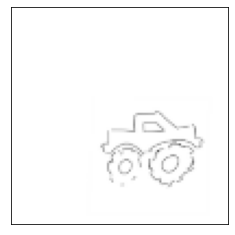

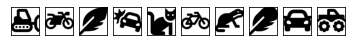

[[6.8409815 0.        4.922651  ... 0.        0.        2.9780304]
 [6.8409815 0.        4.922651  ... 0.        0.        2.9780304]
 [6.8409815 0.        4.922651  ... 0.        0.        2.9780304]
 ...
 [6.8409815 0.        4.922651  ... 0.        0.        2.9780304]
 [6.8409815 0.        4.922651  ... 0.        0.        2.9780304]
 [6.8409815 0.        4.922651  ... 0.        0.        2.9780304]]


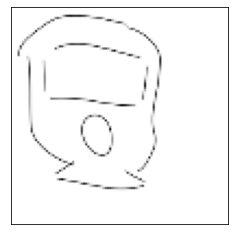

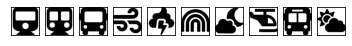

[[ 8.446477  16.432774   5.09162   ...  0.         9.374094   8.0453825]
 [ 8.446477  16.432774   5.09162   ...  0.         9.374094   8.0453825]
 [ 8.446477  16.432774   5.09162   ...  0.         9.374094   8.0453825]
 ...
 [ 8.446477  16.432774   5.09162   ...  0.         9.374094   8.0453825]
 [ 8.446477  16.432774   5.09162   ...  0.         9.374094   8.0453825]
 [ 8.446477  16.432774   5.09162   ...  0.         9.374094   8.0453825]]


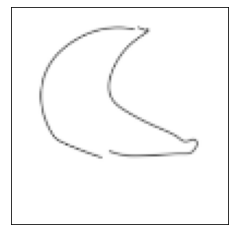

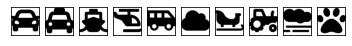

[[2.9757543 4.585617  3.7136214 ... 0.        0.        0.       ]
 [2.9757543 4.585617  3.7136214 ... 0.        0.        0.       ]
 [2.9757543 4.585617  3.7136214 ... 0.        0.        0.       ]
 ...
 [2.9757543 4.585617  3.7136214 ... 0.        0.        0.       ]
 [2.9757543 4.585617  3.7136214 ... 0.        0.        0.       ]
 [2.9757543 4.585617  3.7136214 ... 0.        0.        0.       ]]


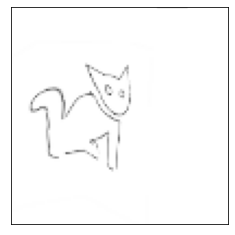

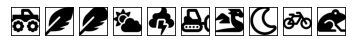

[[ 5.64674    0.        11.677029  ...  4.9263144  1.6519645  1.0189798]
 [ 5.64674    0.        11.677029  ...  4.9263144  1.6519645  1.0189798]
 [ 5.64674    0.        11.677029  ...  4.9263144  1.6519645  1.0189798]
 ...
 [ 5.64674    0.        11.677029  ...  4.9263144  1.6519645  1.0189798]
 [ 5.64674    0.        11.677029  ...  4.9263144  1.6519645  1.0189798]
 [ 5.64674    0.        11.677029  ...  4.9263144  1.6519645  1.0189798]]


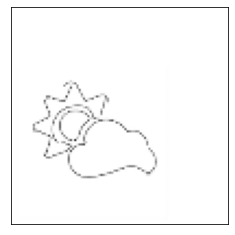

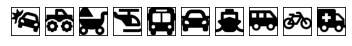

[[ 4.552651  17.215624  21.111334  ...  0.         9.970629   5.5079083]
 [ 4.552651  17.215624  21.111334  ...  0.         9.970629   5.5079083]
 [ 4.552651  17.215624  21.111334  ...  0.         9.970629   5.5079083]
 ...
 [ 4.552651  17.215624  21.111334  ...  0.         9.970629   5.5079083]
 [ 4.552651  17.215624  21.111334  ...  0.         9.970629   5.5079083]
 [ 4.552651  17.215624  21.111334  ...  0.         9.970629   5.5079083]]


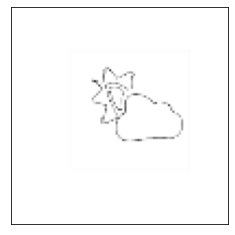

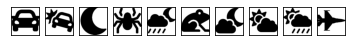

[[0.        8.871113  7.004458  ... 1.0498807 0.        0.       ]
 [0.        8.871113  7.004458  ... 1.0498807 0.        0.       ]
 [0.        8.871113  7.004458  ... 1.0498807 0.        0.       ]
 ...
 [0.        8.871113  7.004458  ... 1.0498807 0.        0.       ]
 [0.        8.871113  7.004458  ... 1.0498807 0.        0.       ]
 [0.        8.871113  7.004458  ... 1.0498807 0.        0.       ]]


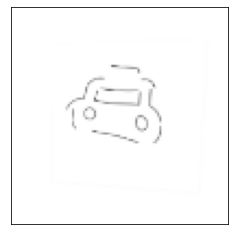

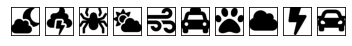

[[ 0.         0.         8.0644045 ...  1.3002717 30.634546   0.       ]
 [ 0.         0.         8.0644045 ...  1.3002717 30.634546   0.       ]
 [ 0.         0.         8.0644045 ...  1.3002717 30.634546   0.       ]
 ...
 [ 0.         0.         8.0644045 ...  1.3002717 30.634546   0.       ]
 [ 0.         0.         8.0644045 ...  1.3002717 30.634546   0.       ]
 [ 0.         0.         8.0644045 ...  1.3002717 30.634546   0.       ]]


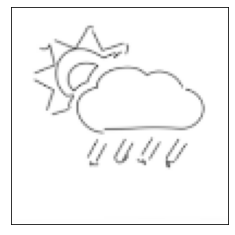

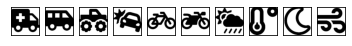

[[ 0.        17.101276   0.        ... 14.237176   0.         3.5678854]
 [ 0.        17.101276   0.        ... 14.237176   0.         3.5678854]
 [ 0.        17.101276   0.        ... 14.237176   0.         3.5678854]
 ...
 [ 0.        17.101276   0.        ... 14.237176   0.         3.5678854]
 [ 0.        17.101276   0.        ... 14.237176   0.         3.5678854]
 [ 0.        17.101276   0.        ... 14.237176   0.         3.5678854]]


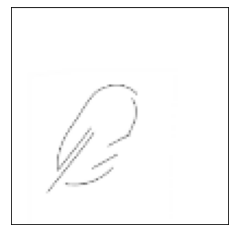

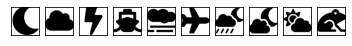

[[ 3.2246952  1.7498214 10.758591  ...  0.         0.         0.       ]
 [ 3.2246952  1.7498214 10.758591  ...  0.         0.         0.       ]
 [ 3.2246952  1.7498214 10.758591  ...  0.         0.         0.       ]
 ...
 [ 3.2246952  1.7498214 10.758591  ...  0.         0.         0.       ]
 [ 3.2246952  1.7498214 10.758591  ...  0.         0.         0.       ]
 [ 3.2246952  1.7498214 10.758591  ...  0.         0.         0.       ]]


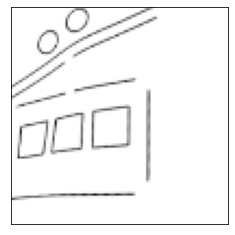

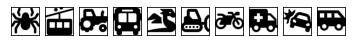

[[ 0.        0.       15.372187 ...  0.        0.        0.      ]
 [ 0.        0.       15.372187 ...  0.        0.        0.      ]
 [ 0.        0.       15.372187 ...  0.        0.        0.      ]
 ...
 [ 0.        0.       15.372187 ...  0.        0.        0.      ]
 [ 0.        0.       15.372187 ...  0.        0.        0.      ]
 [ 0.        0.       15.372187 ...  0.        0.        0.      ]]


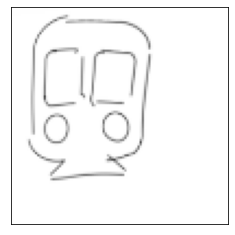

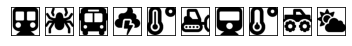

[[ 0.          4.1554027  12.342801   ...  0.18398577  0.
   2.5299244 ]
 [ 0.          4.1554027  12.342801   ...  0.18398577  0.
   2.5299244 ]
 [ 0.          4.1554027  12.342801   ...  0.18398577  0.
   2.5299244 ]
 ...
 [ 0.          4.1554027  12.342801   ...  0.18398577  0.
   2.5299244 ]
 [ 0.          4.1554027  12.342801   ...  0.18398577  0.
   2.5299244 ]
 [ 0.          4.1554027  12.342801   ...  0.18398577  0.
   2.5299244 ]]


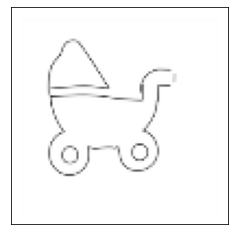

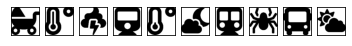

[[ 0.5278801  7.3706703  6.3166027 ... 11.806577  17.034552   0.       ]
 [ 0.5278801  7.3706703  6.3166027 ... 11.806577  17.034552   0.       ]
 [ 0.5278801  7.3706703  6.3166027 ... 11.806577  17.034552   0.       ]
 ...
 [ 0.5278801  7.3706703  6.3166027 ... 11.806577  17.034552   0.       ]
 [ 0.5278801  7.3706703  6.3166027 ... 11.806577  17.034552   0.       ]
 [ 0.5278801  7.3706703  6.3166027 ... 11.806577  17.034552   0.       ]]


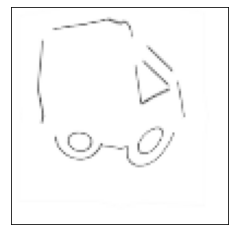

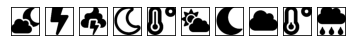

[[ 0.         10.602577    0.85820186 ... 20.5978      0.
   4.2487335 ]
 [ 0.         10.602577    0.85820186 ... 20.5978      0.
   4.2487335 ]
 [ 0.         10.602577    0.85820186 ... 20.5978      0.
   4.2487335 ]
 ...
 [ 0.         10.602577    0.85820186 ... 20.5978      0.
   4.2487335 ]
 [ 0.         10.602577    0.85820186 ... 20.5978      0.
   4.2487335 ]
 [ 0.         10.602577    0.85820186 ... 20.5978      0.
   4.2487335 ]]


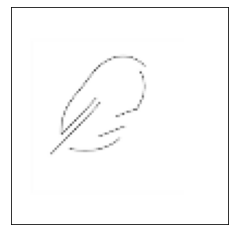

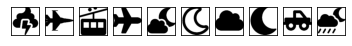

[[2.8224816 0.        0.        ... 0.        0.        0.       ]
 [2.8224816 0.        0.        ... 0.        0.        0.       ]
 [2.8224816 0.        0.        ... 0.        0.        0.       ]
 ...
 [2.8224816 0.        0.        ... 0.        0.        0.       ]
 [2.8224816 0.        0.        ... 0.        0.        0.       ]
 [2.8224816 0.        0.        ... 0.        0.        0.       ]]


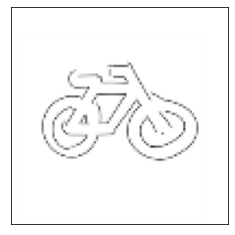

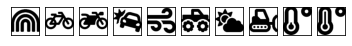

[[0.         0.         4.808351   ... 0.         0.         0.03901355]
 [0.         0.         4.808351   ... 0.         0.         0.03901355]
 [0.         0.         4.808351   ... 0.         0.         0.03901355]
 ...
 [0.         0.         4.808351   ... 0.         0.         0.03901355]
 [0.         0.         4.808351   ... 0.         0.         0.03901355]
 [0.         0.         4.808351   ... 0.         0.         0.03901355]]


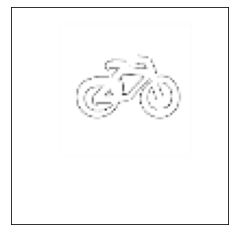

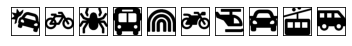

[[11.282518 22.051899 20.06765  ... 16.443699 18.941347 27.805058]
 [11.282518 22.051899 20.06765  ... 16.443699 18.941347 27.805058]
 [11.282518 22.051899 20.06765  ... 16.443699 18.941347 27.805058]
 ...
 [11.282518 22.051899 20.06765  ... 16.443699 18.941347 27.805058]
 [11.282518 22.051899 20.06765  ... 16.443699 18.941347 27.805058]
 [11.282518 22.051899 20.06765  ... 16.443699 18.941347 27.805058]]


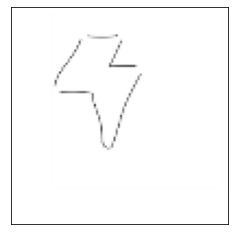

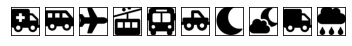

[[15.704201   0.7644677  0.        ... 14.397916   0.        20.187675 ]
 [15.704201   0.7644677  0.        ... 14.397916   0.        20.187675 ]
 [15.704201   0.7644677  0.        ... 14.397916   0.        20.187675 ]
 ...
 [15.704201   0.7644677  0.        ... 14.397916   0.        20.187675 ]
 [15.704201   0.7644677  0.        ... 14.397916   0.        20.187675 ]
 [15.704201   0.7644677  0.        ... 14.397916   0.        20.187675 ]]


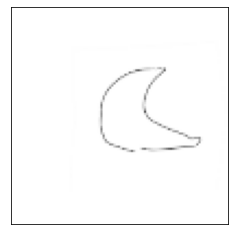

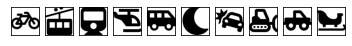

[[17.52166    8.552261  10.155495  ...  5.1955414  0.         1.7336344]
 [17.52166    8.552261  10.155495  ...  5.1955414  0.         1.7336344]
 [17.52166    8.552261  10.155495  ...  5.1955414  0.         1.7336344]
 ...
 [17.52166    8.552261  10.155495  ...  5.1955414  0.         1.7336344]
 [17.52166    8.552261  10.155495  ...  5.1955414  0.         1.7336344]
 [17.52166    8.552261  10.155495  ...  5.1955414  0.         1.7336344]]


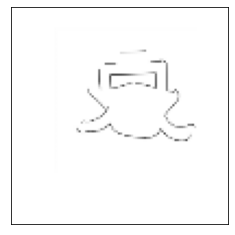

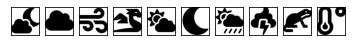

[[ 0.         19.876959    0.         ... 17.186604    0.
   0.77590126]
 [ 0.         19.876959    0.         ... 17.186604    0.
   0.77590126]
 [ 0.         19.876959    0.         ... 17.186604    0.
   0.77590126]
 ...
 [ 0.         19.876959    0.         ... 17.186604    0.
   0.77590126]
 [ 0.         19.876959    0.         ... 17.186604    0.
   0.77590126]
 [ 0.         19.876959    0.         ... 17.186604    0.
   0.77590126]]


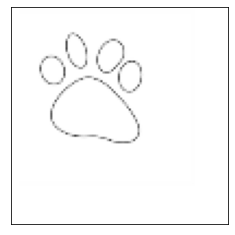

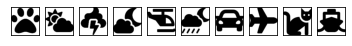

[[7.4231653 0.        8.030225  ... 2.5725725 0.        0.       ]
 [7.4231653 0.        8.030225  ... 2.5725725 0.        0.       ]
 [7.4231653 0.        8.030225  ... 2.5725725 0.        0.       ]
 ...
 [7.4231653 0.        8.030225  ... 2.5725725 0.        0.       ]
 [7.4231653 0.        8.030225  ... 2.5725725 0.        0.       ]
 [7.4231653 0.        8.030225  ... 2.5725725 0.        0.       ]]


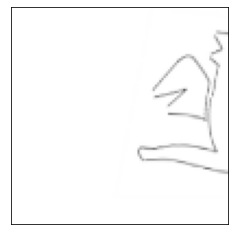

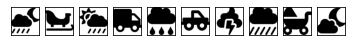

[[ 9.861762   0.         5.238041  ...  0.        12.954317   3.4013019]
 [ 9.861762   0.         5.238041  ...  0.        12.954317   3.4013019]
 [ 9.861762   0.         5.238041  ...  0.        12.954317   3.4013019]
 ...
 [ 9.861762   0.         5.238041  ...  0.        12.954317   3.4013019]
 [ 9.861762   0.         5.238041  ...  0.        12.954317   3.4013019]
 [ 9.861762   0.         5.238041  ...  0.        12.954317   3.4013019]]


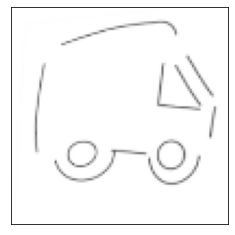

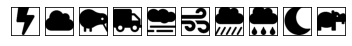

[[ 0.         0.        13.26804   ...  4.2276235  8.736694   4.080246 ]
 [ 0.         0.        13.26804   ...  4.2276235  8.736694   4.080246 ]
 [ 0.         0.        13.26804   ...  4.2276235  8.736694   4.080246 ]
 ...
 [ 0.         0.        13.26804   ...  4.2276235  8.736694   4.080246 ]
 [ 0.         0.        13.26804   ...  4.2276235  8.736694   4.080246 ]
 [ 0.         0.        13.26804   ...  4.2276235  8.736694   4.080246 ]]


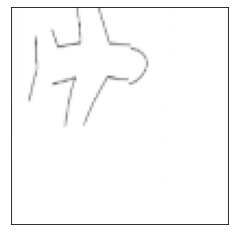

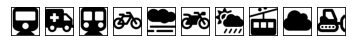

[[6.7392445 0.        1.4447086 ... 0.        0.        0.       ]
 [6.7392445 0.        1.4447086 ... 0.        0.        0.       ]
 [6.7392445 0.        1.4447086 ... 0.        0.        0.       ]
 ...
 [6.7392445 0.        1.4447086 ... 0.        0.        0.       ]
 [6.7392445 0.        1.4447086 ... 0.        0.        0.       ]
 [6.7392445 0.        1.4447086 ... 0.        0.        0.       ]]


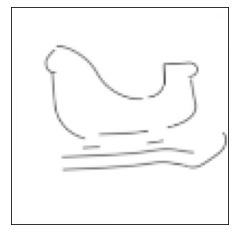

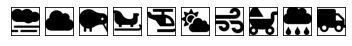

[[0.        3.212774  0.        ... 0.        0.        1.5290066]
 [0.        3.212774  0.        ... 0.        0.        1.5290066]
 [0.        3.212774  0.        ... 0.        0.        1.5290066]
 ...
 [0.        3.212774  0.        ... 0.        0.        1.5290066]
 [0.        3.212774  0.        ... 0.        0.        1.5290066]
 [0.        3.212774  0.        ... 0.        0.        1.5290066]]


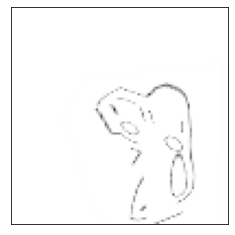

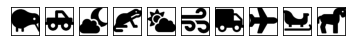

[[ 0.        12.277484   3.1840055 ...  2.8304274  0.         0.       ]
 [ 0.        12.277484   3.1840055 ...  2.8304274  0.         0.       ]
 [ 0.        12.277484   3.1840055 ...  2.8304274  0.         0.       ]
 ...
 [ 0.        12.277484   3.1840055 ...  2.8304274  0.         0.       ]
 [ 0.        12.277484   3.1840055 ...  2.8304274  0.         0.       ]
 [ 0.        12.277484   3.1840055 ...  2.8304274  0.         0.       ]]


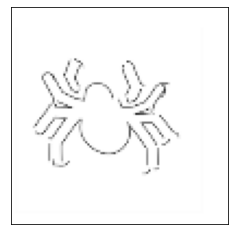

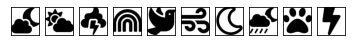

[[0.         0.         0.08411209 ... 0.         0.         0.        ]
 [0.         0.         0.08411209 ... 0.         0.         0.        ]
 [0.         0.         0.08411209 ... 0.         0.         0.        ]
 ...
 [0.         0.         0.08411209 ... 0.         0.         0.        ]
 [0.         0.         0.08411209 ... 0.         0.         0.        ]
 [0.         0.         0.08411209 ... 0.         0.         0.        ]]


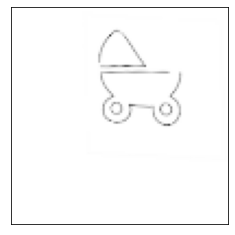

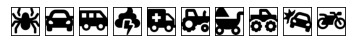

[[ 8.422831  16.187035   0.        ...  0.         0.         1.3943802]
 [ 8.422831  16.187035   0.        ...  0.         0.         1.3943802]
 [ 8.422831  16.187035   0.        ...  0.         0.         1.3943802]
 ...
 [ 8.422831  16.187035   0.        ...  0.         0.         1.3943802]
 [ 8.422831  16.187035   0.        ...  0.         0.         1.3943802]
 [ 8.422831  16.187035   0.        ...  0.         0.         1.3943802]]


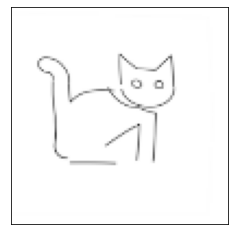

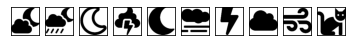

[[15.291811  11.2035675  8.220931  ...  0.         5.899545  10.797458 ]
 [15.291811  11.2035675  8.220931  ...  0.         5.899545  10.797458 ]
 [15.291811  11.2035675  8.220931  ...  0.         5.899545  10.797458 ]
 ...
 [15.291811  11.2035675  8.220931  ...  0.         5.899545  10.797458 ]
 [15.291811  11.2035675  8.220931  ...  0.         5.899545  10.797458 ]
 [15.291811  11.2035675  8.220931  ...  0.         5.899545  10.797458 ]]


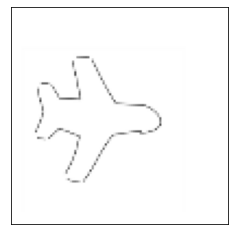

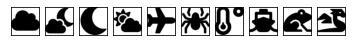

[[0.        3.3867292 1.528364  ... 0.        0.        0.       ]
 [0.        3.3867292 1.528364  ... 0.        0.        0.       ]
 [0.        3.3867292 1.528364  ... 0.        0.        0.       ]
 ...
 [0.        3.3867292 1.528364  ... 0.        0.        0.       ]
 [0.        3.3867292 1.528364  ... 0.        0.        0.       ]
 [0.        3.3867292 1.528364  ... 0.        0.        0.       ]]


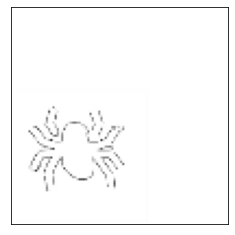

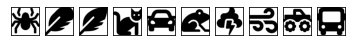

[[ 5.3241816 14.850952   0.        ... 19.343147   0.         4.719032 ]
 [ 5.3241816 14.850952   0.        ... 19.343147   0.         4.719032 ]
 [ 5.3241816 14.850952   0.        ... 19.343147   0.         4.719032 ]
 ...
 [ 5.3241816 14.850952   0.        ... 19.343147   0.         4.719032 ]
 [ 5.3241816 14.850952   0.        ... 19.343147   0.         4.719032 ]
 [ 5.3241816 14.850952   0.        ... 19.343147   0.         4.719032 ]]


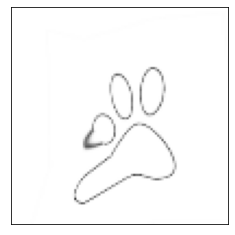

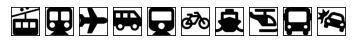

[[ 0.         6.7852287  6.4893055 ...  0.        23.455202   0.       ]
 [ 0.         6.7852287  6.4893055 ...  0.        23.455202   0.       ]
 [ 0.         6.7852287  6.4893055 ...  0.        23.455202   0.       ]
 ...
 [ 0.         6.7852287  6.4893055 ...  0.        23.455202   0.       ]
 [ 0.         6.7852287  6.4893055 ...  0.        23.455202   0.       ]
 [ 0.         6.7852287  6.4893055 ...  0.        23.455202   0.       ]]


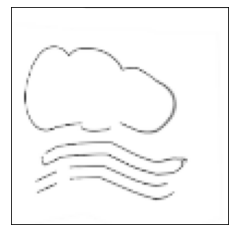

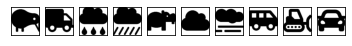

[[ 0.       22.388805  0.       ...  0.       17.464674 17.792208]
 [ 0.       22.388805  0.       ...  0.       17.464674 17.792208]
 [ 0.       22.388805  0.       ...  0.       17.464674 17.792208]
 ...
 [ 0.       22.388805  0.       ...  0.       17.464674 17.792208]
 [ 0.       22.388805  0.       ...  0.       17.464674 17.792208]
 [ 0.       22.388805  0.       ...  0.       17.464674 17.792208]]


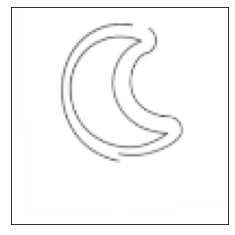

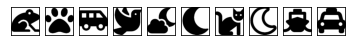

[[0.        0.        4.529592  ... 2.9673002 2.8893914 0.       ]
 [0.        0.        4.529592  ... 2.9673002 2.8893914 0.       ]
 [0.        0.        4.529592  ... 2.9673002 2.8893914 0.       ]
 ...
 [0.        0.        4.529592  ... 2.9673002 2.8893914 0.       ]
 [0.        0.        4.529592  ... 2.9673002 2.8893914 0.       ]
 [0.        0.        4.529592  ... 2.9673002 2.8893914 0.       ]]


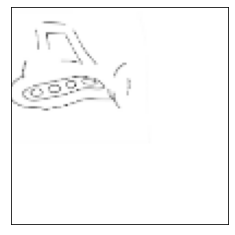

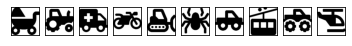

[[0.23779497 0.         6.4367666  ... 0.         9.487919   0.        ]
 [0.23779497 0.         6.4367666  ... 0.         9.487919   0.        ]
 [0.23779497 0.         6.4367666  ... 0.         9.487919   0.        ]
 ...
 [0.23779497 0.         6.4367666  ... 0.         9.487919   0.        ]
 [0.23779497 0.         6.4367666  ... 0.         9.487919   0.        ]
 [0.23779497 0.         6.4367666  ... 0.         9.487919   0.        ]]


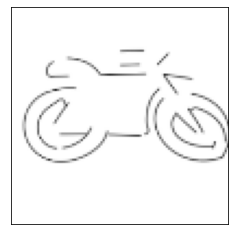

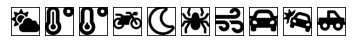

[[0.        0.        3.627881  ... 0.7958062 0.        0.       ]
 [0.        0.        3.627881  ... 0.7958062 0.        0.       ]
 [0.        0.        3.627881  ... 0.7958062 0.        0.       ]
 ...
 [0.        0.        3.627881  ... 0.7958062 0.        0.       ]
 [0.        0.        3.627881  ... 0.7958062 0.        0.       ]
 [0.        0.        3.627881  ... 0.7958062 0.        0.       ]]


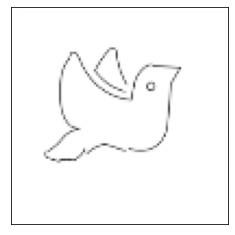

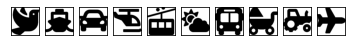

[[ 0.         6.9230614 18.069935  ...  0.        17.99931    0.       ]
 [ 0.         6.9230614 18.069935  ...  0.        17.99931    0.       ]
 [ 0.         6.9230614 18.069935  ...  0.        17.99931    0.       ]
 ...
 [ 0.         6.9230614 18.069935  ...  0.        17.99931    0.       ]
 [ 0.         6.9230614 18.069935  ...  0.        17.99931    0.       ]
 [ 0.         6.9230614 18.069935  ...  0.        17.99931    0.       ]]


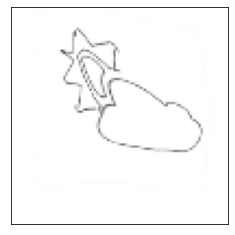

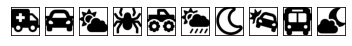

[[15.8160925   0.         31.562073   ...  0.          0.
   0.67590183]
 [15.8160925   0.         31.562073   ...  0.          0.
   0.67590183]
 [15.8160925   0.         31.562073   ...  0.          0.
   0.67590183]
 ...
 [15.8160925   0.         31.562073   ...  0.          0.
   0.67590183]
 [15.8160925   0.         31.562073   ...  0.          0.
   0.67590183]
 [15.8160925   0.         31.562073   ...  0.          0.
   0.67590183]]


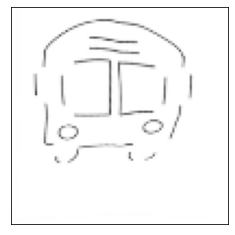

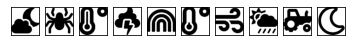

[[13.382275  0.        4.306762 ...  0.        6.600822  0.      ]
 [13.382275  0.        4.306762 ...  0.        6.600822  0.      ]
 [13.382275  0.        4.306762 ...  0.        6.600822  0.      ]
 ...
 [13.382275  0.        4.306762 ...  0.        6.600822  0.      ]
 [13.382275  0.        4.306762 ...  0.        6.600822  0.      ]
 [13.382275  0.        4.306762 ...  0.        6.600822  0.      ]]


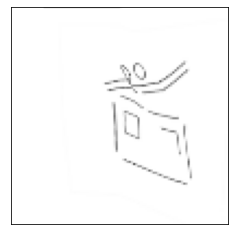

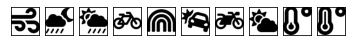

[[7.3928885 0.        8.665469  ... 4.7692103 0.        0.       ]
 [7.3928885 0.        8.665469  ... 4.7692103 0.        0.       ]
 [7.3928885 0.        8.665469  ... 4.7692103 0.        0.       ]
 ...
 [7.3928885 0.        8.665469  ... 4.7692103 0.        0.       ]
 [7.3928885 0.        8.665469  ... 4.7692103 0.        0.       ]
 [7.3928885 0.        8.665469  ... 4.7692103 0.        0.       ]]


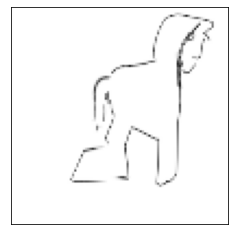

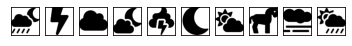

[[0.        9.315161  9.108741  ... 0.        0.        1.1149005]
 [0.        9.315161  9.108741  ... 0.        0.        1.1149005]
 [0.        9.315161  9.108741  ... 0.        0.        1.1149005]
 ...
 [0.        9.315161  9.108741  ... 0.        0.        1.1149005]
 [0.        9.315161  9.108741  ... 0.        0.        1.1149005]
 [0.        9.315161  9.108741  ... 0.        0.        1.1149005]]


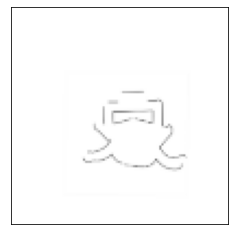

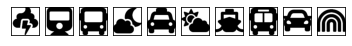

[[ 1.1541564  0.        18.093979  ...  0.        10.71918    0.       ]
 [ 1.1541564  0.        18.093979  ...  0.        10.71918    0.       ]
 [ 1.1541564  0.        18.093979  ...  0.        10.71918    0.       ]
 ...
 [ 1.1541564  0.        18.093979  ...  0.        10.71918    0.       ]
 [ 1.1541564  0.        18.093979  ...  0.        10.71918    0.       ]
 [ 1.1541564  0.        18.093979  ...  0.        10.71918    0.       ]]


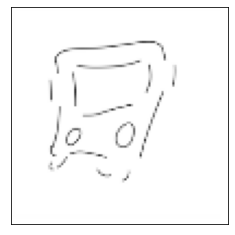

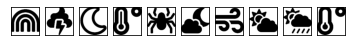

[[19.811285    0.14792135  5.0237775  ...  0.         13.571008
  23.197561  ]
 [19.811285    0.14792135  5.0237775  ...  0.         13.571008
  23.197561  ]
 [19.811285    0.14792135  5.0237775  ...  0.         13.571008
  23.197561  ]
 ...
 [19.811285    0.14792135  5.0237775  ...  0.         13.571008
  23.197561  ]
 [19.811285    0.14792135  5.0237775  ...  0.         13.571008
  23.197561  ]
 [19.811285    0.14792135  5.0237775  ...  0.         13.571008
  23.197561  ]]


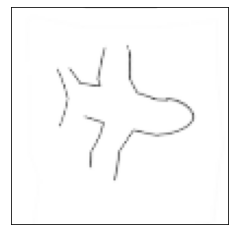

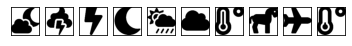

[[5.951379  5.4234586 9.137058  ... 0.        6.8828745 3.400771 ]
 [5.951379  5.4234586 9.137058  ... 0.        6.8828745 3.400771 ]
 [5.951379  5.4234586 9.137058  ... 0.        6.8828745 3.400771 ]
 ...
 [5.951379  5.4234586 9.137058  ... 0.        6.8828745 3.400771 ]
 [5.951379  5.4234586 9.137058  ... 0.        6.8828745 3.400771 ]
 [5.951379  5.4234586 9.137058  ... 0.        6.8828745 3.400771 ]]


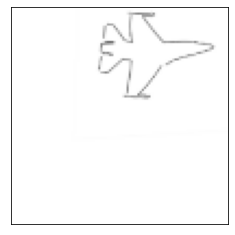

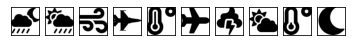

[[ 0.        0.        8.101188 ... 11.945638 15.139788 24.3436  ]
 [ 0.        0.        8.101188 ... 11.945638 15.139788 24.3436  ]
 [ 0.        0.        8.101188 ... 11.945638 15.139788 24.3436  ]
 ...
 [ 0.        0.        8.101188 ... 11.945638 15.139788 24.3436  ]
 [ 0.        0.        8.101188 ... 11.945638 15.139788 24.3436  ]
 [ 0.        0.        8.101188 ... 11.945638 15.139788 24.3436  ]]


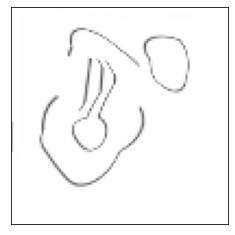

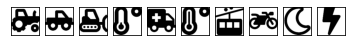

[[0.        4.477294  0.        ... 0.        4.7812057 2.709224 ]
 [0.        4.477294  0.        ... 0.        4.7812057 2.709224 ]
 [0.        4.477294  0.        ... 0.        4.7812057 2.709224 ]
 ...
 [0.        4.477294  0.        ... 0.        4.7812057 2.709224 ]
 [0.        4.477294  0.        ... 0.        4.7812057 2.709224 ]
 [0.        4.477294  0.        ... 0.        4.7812057 2.709224 ]]


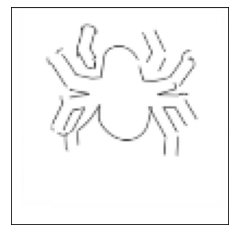

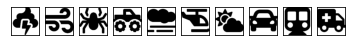

[[0.        2.0012562 6.461092  ... 0.        0.        3.5376074]
 [0.        2.0012562 6.461092  ... 0.        0.        3.5376074]
 [0.        2.0012562 6.461092  ... 0.        0.        3.5376074]
 ...
 [0.        2.0012562 6.461092  ... 0.        0.        3.5376074]
 [0.        2.0012562 6.461092  ... 0.        0.        3.5376074]
 [0.        2.0012562 6.461092  ... 0.        0.        3.5376074]]


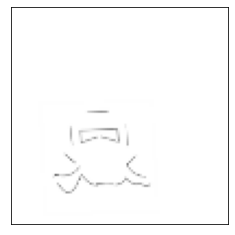

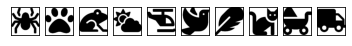

[[ 0.         2.2000341 15.843056  ...  5.7286825  0.         5.1098037]
 [ 0.         2.2000341 15.843056  ...  5.7286825  0.         5.1098037]
 [ 0.         2.2000341 15.843056  ...  5.7286825  0.         5.1098037]
 ...
 [ 0.         2.2000341 15.843056  ...  5.7286825  0.         5.1098037]
 [ 0.         2.2000341 15.843056  ...  5.7286825  0.         5.1098037]
 [ 0.         2.2000341 15.843056  ...  5.7286825  0.         5.1098037]]


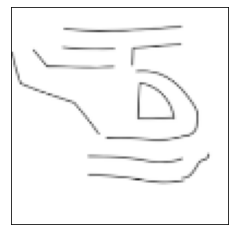

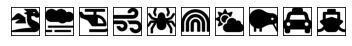

[[ 0.       10.108561  9.589463 ...  0.       18.215954  0.      ]
 [ 0.       10.108561  9.589463 ...  0.       18.215954  0.      ]
 [ 0.       10.108561  9.589463 ...  0.       18.215954  0.      ]
 ...
 [ 0.       10.108561  9.589463 ...  0.       18.215954  0.      ]
 [ 0.       10.108561  9.589463 ...  0.       18.215954  0.      ]
 [ 0.       10.108561  9.589463 ...  0.       18.215954  0.      ]]


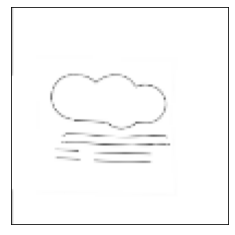

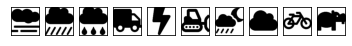

[[9.6403055 0.        7.0228972 ... 0.        2.5967894 0.       ]
 [9.6403055 0.        7.0228972 ... 0.        2.5967894 0.       ]
 [9.6403055 0.        7.0228972 ... 0.        2.5967894 0.       ]
 ...
 [9.6403055 0.        7.0228972 ... 0.        2.5967894 0.       ]
 [9.6403055 0.        7.0228972 ... 0.        2.5967894 0.       ]
 [9.6403055 0.        7.0228972 ... 0.        2.5967894 0.       ]]


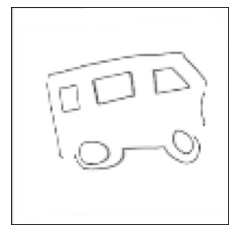

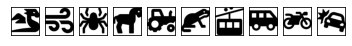

[[ 0.        0.        0.       ... 16.099766  0.        0.      ]
 [ 0.        0.        0.       ... 16.099766  0.        0.      ]
 [ 0.        0.        0.       ... 16.099766  0.        0.      ]
 ...
 [ 0.        0.        0.       ... 16.099766  0.        0.      ]
 [ 0.        0.        0.       ... 16.099766  0.        0.      ]
 [ 0.        0.        0.       ... 16.099766  0.        0.      ]]


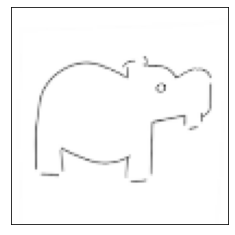

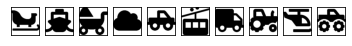

[[ 0.17086163  8.052824    4.075901   ... 10.240354    0.54648066
   4.4417377 ]
 [ 0.17086163  8.052824    4.075901   ... 10.240354    0.54648066
   4.4417377 ]
 [ 0.17086163  8.052824    4.075901   ... 10.240354    0.54648066
   4.4417377 ]
 ...
 [ 0.17086163  8.052824    4.075901   ... 10.240354    0.54648066
   4.4417377 ]
 [ 0.17086163  8.052824    4.075901   ... 10.240354    0.54648066
   4.4417377 ]
 [ 0.17086163  8.052824    4.075901   ... 10.240354    0.54648066
   4.4417377 ]]


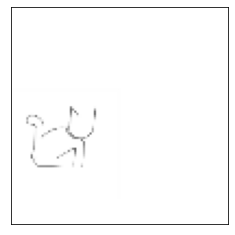

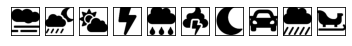

[[0.         0.         0.95140094 ... 0.         0.76396525 2.4756958 ]
 [0.         0.         0.95140094 ... 0.         0.76396525 2.4756958 ]
 [0.         0.         0.95140094 ... 0.         0.76396525 2.4756958 ]
 ...
 [0.         0.         0.95140094 ... 0.         0.76396525 2.4756958 ]
 [0.         0.         0.95140094 ... 0.         0.76396525 2.4756958 ]
 [0.         0.         0.95140094 ... 0.         0.76396525 2.4756958 ]]


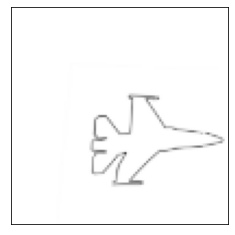

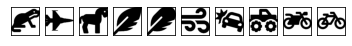

[[ 0.        13.458772   7.0803046 ... 15.637724   0.         0.       ]
 [ 0.        13.458772   7.0803046 ... 15.637724   0.         0.       ]
 [ 0.        13.458772   7.0803046 ... 15.637724   0.         0.       ]
 ...
 [ 0.        13.458772   7.0803046 ... 15.637724   0.         0.       ]
 [ 0.        13.458772   7.0803046 ... 15.637724   0.         0.       ]
 [ 0.        13.458772   7.0803046 ... 15.637724   0.         0.       ]]


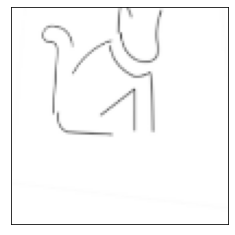

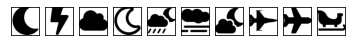

[[ 0.         8.273267  10.2610235 ...  0.         5.2642694  8.073043 ]
 [ 0.         8.273267  10.2610235 ...  0.         5.2642694  8.073043 ]
 [ 0.         8.273267  10.2610235 ...  0.         5.2642694  8.073043 ]
 ...
 [ 0.         8.273267  10.2610235 ...  0.         5.2642694  8.073043 ]
 [ 0.         8.273267  10.2610235 ...  0.         5.2642694  8.073043 ]
 [ 0.         8.273267  10.2610235 ...  0.         5.2642694  8.073043 ]]


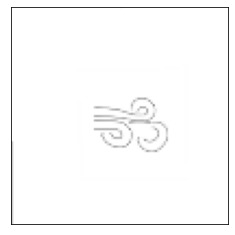

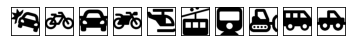

[[11.160515   0.         4.4490933 ...  8.6137085  6.413867   0.       ]
 [11.160515   0.         4.4490933 ...  8.6137085  6.413867   0.       ]
 [11.160515   0.         4.4490933 ...  8.6137085  6.413867   0.       ]
 ...
 [11.160515   0.         4.4490933 ...  8.6137085  6.413867   0.       ]
 [11.160515   0.         4.4490933 ...  8.6137085  6.413867   0.       ]
 [11.160515   0.         4.4490933 ...  8.6137085  6.413867   0.       ]]


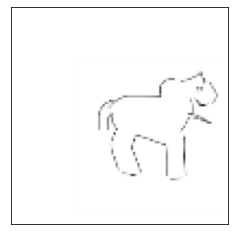

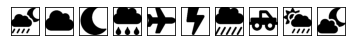

[[0.        0.        5.5360093 ... 0.        3.3644075 0.       ]
 [0.        0.        5.5360093 ... 0.        3.3644075 0.       ]
 [0.        0.        5.5360093 ... 0.        3.3644075 0.       ]
 ...
 [0.        0.        5.5360093 ... 0.        3.3644075 0.       ]
 [0.        0.        5.5360093 ... 0.        3.3644075 0.       ]
 [0.        0.        5.5360093 ... 0.        3.3644075 0.       ]]


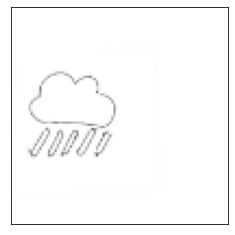

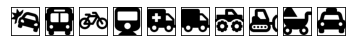

[[13.23852   0.        0.       ...  0.       10.227072  0.      ]
 [13.23852   0.        0.       ...  0.       10.227072  0.      ]
 [13.23852   0.        0.       ...  0.       10.227072  0.      ]
 ...
 [13.23852   0.        0.       ...  0.       10.227072  0.      ]
 [13.23852   0.        0.       ...  0.       10.227072  0.      ]
 [13.23852   0.        0.       ...  0.       10.227072  0.      ]]


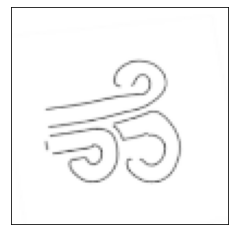

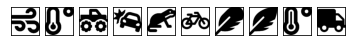

[[0.        0.        1.6446481 ... 3.4381225 0.        0.       ]
 [0.        0.        1.6446481 ... 3.4381225 0.        0.       ]
 [0.        0.        1.6446481 ... 3.4381225 0.        0.       ]
 ...
 [0.        0.        1.6446481 ... 3.4381225 0.        0.       ]
 [0.        0.        1.6446481 ... 3.4381225 0.        0.       ]
 [0.        0.        1.6446481 ... 3.4381225 0.        0.       ]]


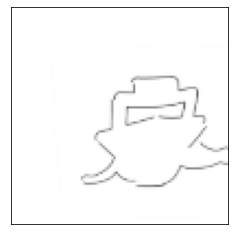

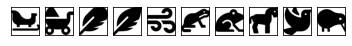

[[ 0.         0.         0.9130371 ... 13.3960085  0.         0.       ]
 [ 0.         0.         0.9130371 ... 13.3960085  0.         0.       ]
 [ 0.         0.         0.9130371 ... 13.3960085  0.         0.       ]
 ...
 [ 0.         0.         0.9130371 ... 13.3960085  0.         0.       ]
 [ 0.         0.         0.9130371 ... 13.3960085  0.         0.       ]
 [ 0.         0.         0.9130371 ... 13.3960085  0.         0.       ]]


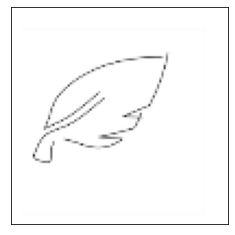

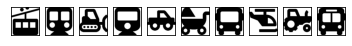

[[ 3.4553876  7.0401754 10.333235  ...  0.         0.        19.956995 ]
 [ 3.4553876  7.0401754 10.333235  ...  0.         0.        19.956995 ]
 [ 3.4553876  7.0401754 10.333235  ...  0.         0.        19.956995 ]
 ...
 [ 3.4553876  7.0401754 10.333235  ...  0.         0.        19.956995 ]
 [ 3.4553876  7.0401754 10.333235  ...  0.         0.        19.956995 ]
 [ 3.4553876  7.0401754 10.333235  ...  0.         0.        19.956995 ]]


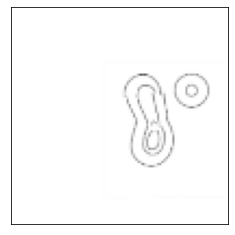

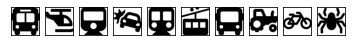

[[ 0.         9.339382   3.505127  ...  2.4242547 16.158102  15.595972 ]
 [ 0.         9.339382   3.505127  ...  2.4242547 16.158102  15.595972 ]
 [ 0.         9.339382   3.505127  ...  2.4242547 16.158102  15.595972 ]
 ...
 [ 0.         9.339382   3.505127  ...  2.4242547 16.158102  15.595972 ]
 [ 0.         9.339382   3.505127  ...  2.4242547 16.158102  15.595972 ]
 [ 0.         9.339382   3.505127  ...  2.4242547 16.158102  15.595972 ]]


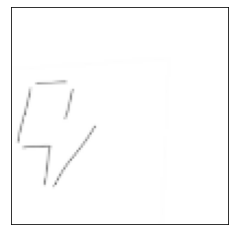

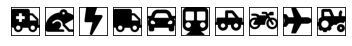

[[ 3.9172611  0.        22.216736  ...  0.         0.         0.       ]
 [ 3.9172611  0.        22.216736  ...  0.         0.         0.       ]
 [ 3.9172611  0.        22.216736  ...  0.         0.         0.       ]
 ...
 [ 3.9172611  0.        22.216736  ...  0.         0.         0.       ]
 [ 3.9172611  0.        22.216736  ...  0.         0.         0.       ]
 [ 3.9172611  0.        22.216736  ...  0.         0.         0.       ]]


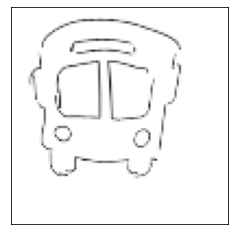

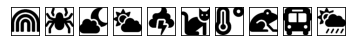

[[0.        4.7760043 2.2480655 ... 0.        0.        0.       ]
 [0.        4.7760043 2.2480655 ... 0.        0.        0.       ]
 [0.        4.7760043 2.2480655 ... 0.        0.        0.       ]
 ...
 [0.        4.7760043 2.2480655 ... 0.        0.        0.       ]
 [0.        4.7760043 2.2480655 ... 0.        0.        0.       ]
 [0.        4.7760043 2.2480655 ... 0.        0.        0.       ]]


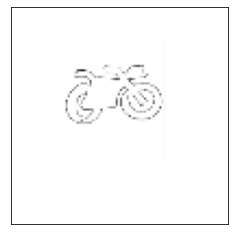

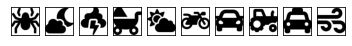

[[0.        0.        5.9119616 ... 0.        0.        0.6872007]
 [0.        0.        5.9119616 ... 0.        0.        0.6872007]
 [0.        0.        5.9119616 ... 0.        0.        0.6872007]
 ...
 [0.        0.        5.9119616 ... 0.        0.        0.6872007]
 [0.        0.        5.9119616 ... 0.        0.        0.6872007]
 [0.        0.        5.9119616 ... 0.        0.        0.6872007]]


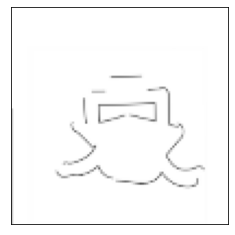

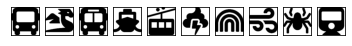

[[0.        4.1340637 7.6870475 ... 0.        0.        4.0226955]
 [0.        4.1340637 7.6870475 ... 0.        0.        4.0226955]
 [0.        4.1340637 7.6870475 ... 0.        0.        4.0226955]
 ...
 [0.        4.1340637 7.6870475 ... 0.        0.        4.0226955]
 [0.        4.1340637 7.6870475 ... 0.        0.        4.0226955]
 [0.        4.1340637 7.6870475 ... 0.        0.        4.0226955]]


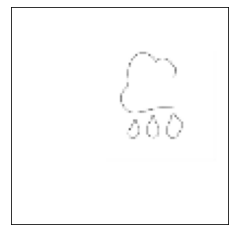

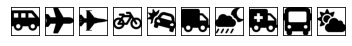

[[ 0.       15.672632  0.       ... 12.479441  0.        0.      ]
 [ 0.       15.672632  0.       ... 12.479441  0.        0.      ]
 [ 0.       15.672632  0.       ... 12.479441  0.        0.      ]
 ...
 [ 0.       15.672632  0.       ... 12.479441  0.        0.      ]
 [ 0.       15.672632  0.       ... 12.479441  0.        0.      ]
 [ 0.       15.672632  0.       ... 12.479441  0.        0.      ]]


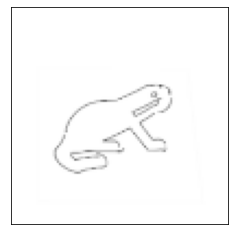

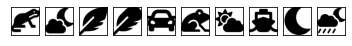

[[0.        4.8564053 1.5326086 ... 0.        1.268188  5.534872 ]
 [0.        4.8564053 1.5326086 ... 0.        1.268188  5.534872 ]
 [0.        4.8564053 1.5326086 ... 0.        1.268188  5.534872 ]
 ...
 [0.        4.8564053 1.5326086 ... 0.        1.268188  5.534872 ]
 [0.        4.8564053 1.5326086 ... 0.        1.268188  5.534872 ]
 [0.        4.8564053 1.5326086 ... 0.        1.268188  5.534872 ]]


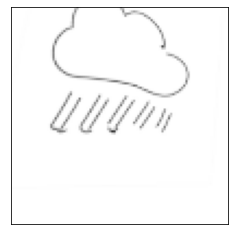

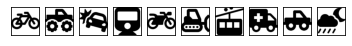

[[ 0.         0.         0.        ...  2.4174488 16.508486   0.       ]
 [ 0.         0.         0.        ...  2.4174488 16.508486   0.       ]
 [ 0.         0.         0.        ...  2.4174488 16.508486   0.       ]
 ...
 [ 0.         0.         0.        ...  2.4174488 16.508486   0.       ]
 [ 0.         0.         0.        ...  2.4174488 16.508486   0.       ]
 [ 0.         0.         0.        ...  2.4174488 16.508486   0.       ]]


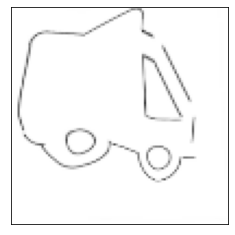

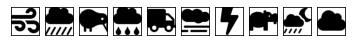

[[ 1.201464 11.219288  0.       ... 11.714289  0.        8.320495]
 [ 1.201464 11.219288  0.       ... 11.714289  0.        8.320495]
 [ 1.201464 11.219288  0.       ... 11.714289  0.        8.320495]
 ...
 [ 1.201464 11.219288  0.       ... 11.714289  0.        8.320495]
 [ 1.201464 11.219288  0.       ... 11.714289  0.        8.320495]
 [ 1.201464 11.219288  0.       ... 11.714289  0.        8.320495]]


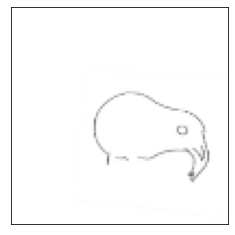

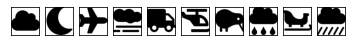

[[0.         0.         0.75940543 ... 3.318868   5.309547   2.2681777 ]
 [0.         0.         0.75940543 ... 3.318868   5.309547   2.2681777 ]
 [0.         0.         0.75940543 ... 3.318868   5.309547   2.2681777 ]
 ...
 [0.         0.         0.75940543 ... 3.318868   5.309547   2.2681777 ]
 [0.         0.         0.75940543 ... 3.318868   5.309547   2.2681777 ]
 [0.         0.         0.75940543 ... 3.318868   5.309547   2.2681777 ]]


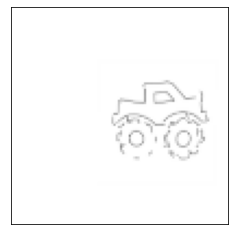

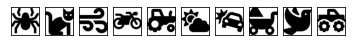

[[ 0.        0.       10.888581 ... 17.839457  0.        0.      ]
 [ 0.        0.       10.888581 ... 17.839457  0.        0.      ]
 [ 0.        0.       10.888581 ... 17.839457  0.        0.      ]
 ...
 [ 0.        0.       10.888581 ... 17.839457  0.        0.      ]
 [ 0.        0.       10.888581 ... 17.839457  0.        0.      ]
 [ 0.        0.       10.888581 ... 17.839457  0.        0.      ]]


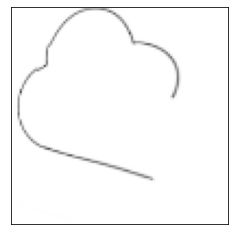

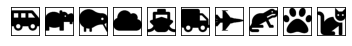

[[0.        6.2117014 7.9312463 ... 0.        6.7877774 0.       ]
 [0.        6.2117014 7.9312463 ... 0.        6.7877774 0.       ]
 [0.        6.2117014 7.9312463 ... 0.        6.7877774 0.       ]
 ...
 [0.        6.2117014 7.9312463 ... 0.        6.7877774 0.       ]
 [0.        6.2117014 7.9312463 ... 0.        6.7877774 0.       ]
 [0.        6.2117014 7.9312463 ... 0.        6.7877774 0.       ]]


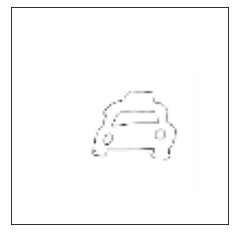

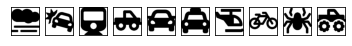

[[ 0.        0.        0.       ...  0.       24.267496 21.147627]
 [ 0.        0.        0.       ...  0.       24.267496 21.147627]
 [ 0.        0.        0.       ...  0.       24.267496 21.147627]
 ...
 [ 0.        0.        0.       ...  0.       24.267496 21.147627]
 [ 0.        0.        0.       ...  0.       24.267496 21.147627]
 [ 0.        0.        0.       ...  0.       24.267496 21.147627]]


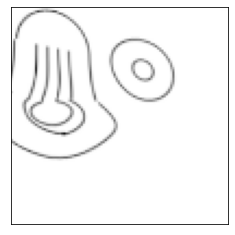

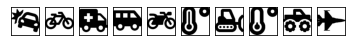

[[ 1.1231238 12.859964   2.4005032 ...  1.1376832  2.5019448  5.3448353]
 [ 1.1231238 12.859964   2.4005032 ...  1.1376832  2.5019448  5.3448353]
 [ 1.1231238 12.859964   2.4005032 ...  1.1376832  2.5019448  5.3448353]
 ...
 [ 1.1231238 12.859964   2.4005032 ...  1.1376832  2.5019448  5.3448353]
 [ 1.1231238 12.859964   2.4005032 ...  1.1376832  2.5019448  5.3448353]
 [ 1.1231238 12.859964   2.4005032 ...  1.1376832  2.5019448  5.3448353]]


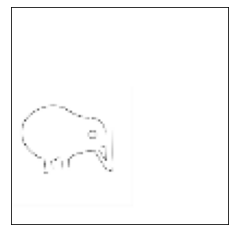

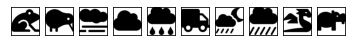

[[10.6945095  4.482703   8.045085  ...  0.         0.         0.       ]
 [10.6945095  4.482703   8.045085  ...  0.         0.         0.       ]
 [10.6945095  4.482703   8.045085  ...  0.         0.         0.       ]
 ...
 [10.6945095  4.482703   8.045085  ...  0.         0.         0.       ]
 [10.6945095  4.482703   8.045085  ...  0.         0.         0.       ]
 [10.6945095  4.482703   8.045085  ...  0.         0.         0.       ]]


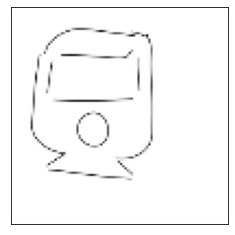

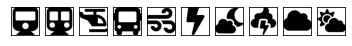

[[ 0.       16.9332    9.245798 ...  2.877025 19.600527 16.727522]
 [ 0.       16.9332    9.245798 ...  2.877025 19.600527 16.727522]
 [ 0.       16.9332    9.245798 ...  2.877025 19.600527 16.727522]
 ...
 [ 0.       16.9332    9.245798 ...  2.877025 19.600527 16.727522]
 [ 0.       16.9332    9.245798 ...  2.877025 19.600527 16.727522]
 [ 0.       16.9332    9.245798 ...  2.877025 19.600527 16.727522]]


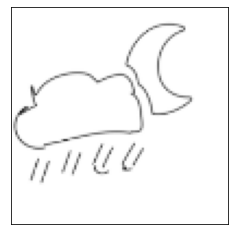

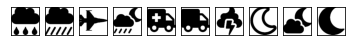

[[ 2.338748  11.410626   0.        ...  4.8084254 15.933353  10.386061 ]
 [ 2.338748  11.410626   0.        ...  4.8084254 15.933353  10.386061 ]
 [ 2.338748  11.410626   0.        ...  4.8084254 15.933353  10.386061 ]
 ...
 [ 2.338748  11.410626   0.        ...  4.8084254 15.933353  10.386061 ]
 [ 2.338748  11.410626   0.        ...  4.8084254 15.933353  10.386061 ]
 [ 2.338748  11.410626   0.        ...  4.8084254 15.933353  10.386061 ]]


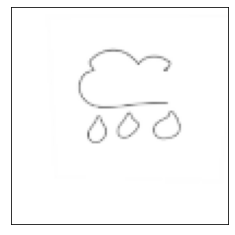

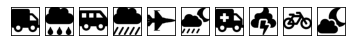

[[ 0.        0.       12.164925 ...  0.        0.        0.      ]
 [ 0.        0.       12.164925 ...  0.        0.        0.      ]
 [ 0.        0.       12.164925 ...  0.        0.        0.      ]
 ...
 [ 0.        0.       12.164925 ...  0.        0.        0.      ]
 [ 0.        0.       12.164925 ...  0.        0.        0.      ]
 [ 0.        0.       12.164925 ...  0.        0.        0.      ]]


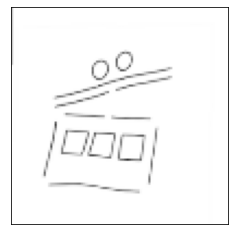

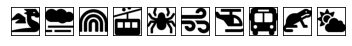

[[ 1.2424623 10.209179   3.9349253 ...  4.592378   0.         0.8593225]
 [ 1.2424623 10.209179   3.9349253 ...  4.592378   0.         0.8593225]
 [ 1.2424623 10.209179   3.9349253 ...  4.592378   0.         0.8593225]
 ...
 [ 1.2424623 10.209179   3.9349253 ...  4.592378   0.         0.8593225]
 [ 1.2424623 10.209179   3.9349253 ...  4.592378   0.         0.8593225]
 [ 1.2424623 10.209179   3.9349253 ...  4.592378   0.         0.8593225]]


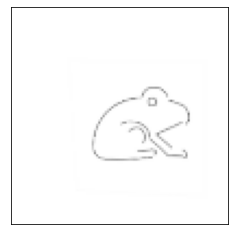

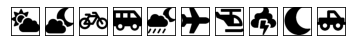

[[ 0.       16.399912  0.       ... 25.293581  0.        0.      ]
 [ 0.       16.399912  0.       ... 25.293581  0.        0.      ]
 [ 0.       16.399912  0.       ... 25.293581  0.        0.      ]
 ...
 [ 0.       16.399912  0.       ... 25.293581  0.        0.      ]
 [ 0.       16.399912  0.       ... 25.293581  0.        0.      ]
 [ 0.       16.399912  0.       ... 25.293581  0.        0.      ]]


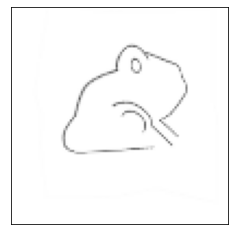

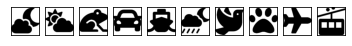

[[0.        0.        0.        ... 1.6267772 0.        2.5390308]
 [0.        0.        0.        ... 1.6267772 0.        2.5390308]
 [0.        0.        0.        ... 1.6267772 0.        2.5390308]
 ...
 [0.        0.        0.        ... 1.6267772 0.        2.5390308]
 [0.        0.        0.        ... 1.6267772 0.        2.5390308]
 [0.        0.        0.        ... 1.6267772 0.        2.5390308]]


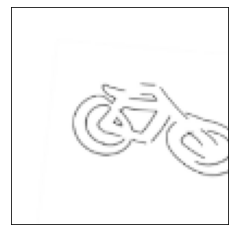

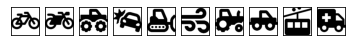

[[ 1.3552748 10.26545    8.279661  ...  6.988402   1.4055424  0.       ]
 [ 1.3552748 10.26545    8.279661  ...  6.988402   1.4055424  0.       ]
 [ 1.3552748 10.26545    8.279661  ...  6.988402   1.4055424  0.       ]
 ...
 [ 1.3552748 10.26545    8.279661  ...  6.988402   1.4055424  0.       ]
 [ 1.3552748 10.26545    8.279661  ...  6.988402   1.4055424  0.       ]
 [ 1.3552748 10.26545    8.279661  ...  6.988402   1.4055424  0.       ]]


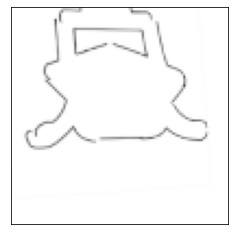

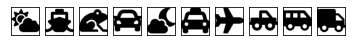

[[12.201378  13.353693  18.46511   ...  1.6260388 11.224671  11.7848015]
 [12.201378  13.353693  18.46511   ...  1.6260388 11.224671  11.7848015]
 [12.201378  13.353693  18.46511   ...  1.6260388 11.224671  11.7848015]
 ...
 [12.201378  13.353693  18.46511   ...  1.6260388 11.224671  11.7848015]
 [12.201378  13.353693  18.46511   ...  1.6260388 11.224671  11.7848015]
 [12.201378  13.353693  18.46511   ...  1.6260388 11.224671  11.7848015]]


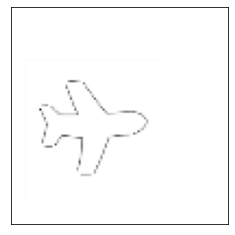

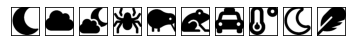

[[ 0.       14.104769  0.       ... 16.55902   0.       21.94505 ]
 [ 0.       14.104769  0.       ... 16.55902   0.       21.94505 ]
 [ 0.       14.104769  0.       ... 16.55902   0.       21.94505 ]
 ...
 [ 0.       14.104769  0.       ... 16.55902   0.       21.94505 ]
 [ 0.       14.104769  0.       ... 16.55902   0.       21.94505 ]
 [ 0.       14.104769  0.       ... 16.55902   0.       21.94505 ]]


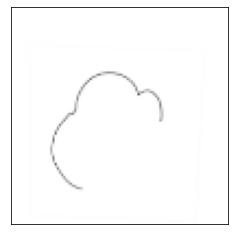

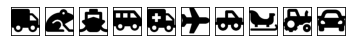

[[ 0.        0.        7.114186 ...  0.       12.027746 10.727668]
 [ 0.        0.        7.114186 ...  0.       12.027746 10.727668]
 [ 0.        0.        7.114186 ...  0.       12.027746 10.727668]
 ...
 [ 0.        0.        7.114186 ...  0.       12.027746 10.727668]
 [ 0.        0.        7.114186 ...  0.       12.027746 10.727668]
 [ 0.        0.        7.114186 ...  0.       12.027746 10.727668]]


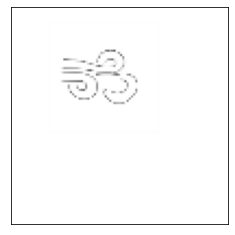

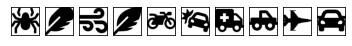

[[ 0.       12.624598 10.863493 ...  9.597169  0.        6.078793]
 [ 0.       12.624598 10.863493 ...  9.597169  0.        6.078793]
 [ 0.       12.624598 10.863493 ...  9.597169  0.        6.078793]
 ...
 [ 0.       12.624598 10.863493 ...  9.597169  0.        6.078793]
 [ 0.       12.624598 10.863493 ...  9.597169  0.        6.078793]
 [ 0.       12.624598 10.863493 ...  9.597169  0.        6.078793]]


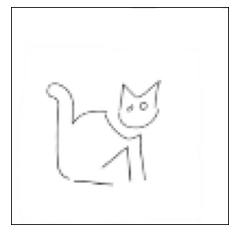

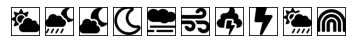

[[ 0.       12.31169   8.330191 ... 16.277288 20.4411   18.479504]
 [ 0.       12.31169   8.330191 ... 16.277288 20.4411   18.479504]
 [ 0.       12.31169   8.330191 ... 16.277288 20.4411   18.479504]
 ...
 [ 0.       12.31169   8.330191 ... 16.277288 20.4411   18.479504]
 [ 0.       12.31169   8.330191 ... 16.277288 20.4411   18.479504]
 [ 0.       12.31169   8.330191 ... 16.277288 20.4411   18.479504]]


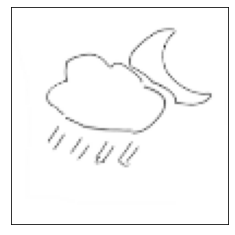

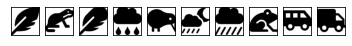

[[ 0.          0.15748456  0.         ... 18.437428    0.
  10.770116  ]
 [ 0.          0.15748456  0.         ... 18.437428    0.
  10.770116  ]
 [ 0.          0.15748456  0.         ... 18.437428    0.
  10.770116  ]
 ...
 [ 0.          0.15748456  0.         ... 18.437428    0.
  10.770116  ]
 [ 0.          0.15748456  0.         ... 18.437428    0.
  10.770116  ]
 [ 0.          0.15748456  0.         ... 18.437428    0.
  10.770116  ]]


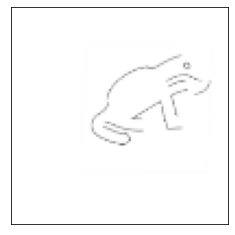

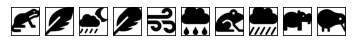

[[ 0.       11.727243 10.260615 ... 18.729086  0.       20.54644 ]
 [ 0.       11.727243 10.260615 ... 18.729086  0.       20.54644 ]
 [ 0.       11.727243 10.260615 ... 18.729086  0.       20.54644 ]
 ...
 [ 0.       11.727243 10.260615 ... 18.729086  0.       20.54644 ]
 [ 0.       11.727243 10.260615 ... 18.729086  0.       20.54644 ]
 [ 0.       11.727243 10.260615 ... 18.729086  0.       20.54644 ]]


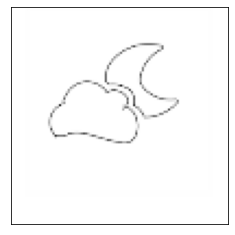

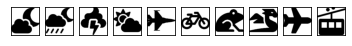

[[0.       0.       8.264832 ... 0.       0.       0.      ]
 [0.       0.       8.264832 ... 0.       0.       0.      ]
 [0.       0.       8.264832 ... 0.       0.       0.      ]
 ...
 [0.       0.       8.264832 ... 0.       0.       0.      ]
 [0.       0.       8.264832 ... 0.       0.       0.      ]
 [0.       0.       8.264832 ... 0.       0.       0.      ]]


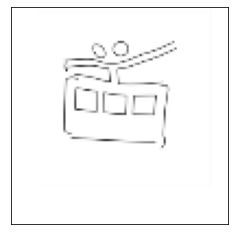

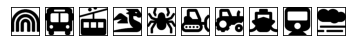

[[ 5.7580523 34.567      8.04357   ...  7.5945687 24.578653  17.004335 ]
 [ 5.7580523 34.567      8.04357   ...  7.5945687 24.578653  17.004335 ]
 [ 5.7580523 34.567      8.04357   ...  7.5945687 24.578653  17.004335 ]
 ...
 [ 5.7580523 34.567      8.04357   ...  7.5945687 24.578653  17.004335 ]
 [ 5.7580523 34.567      8.04357   ...  7.5945687 24.578653  17.004335 ]
 [ 5.7580523 34.567      8.04357   ...  7.5945687 24.578653  17.004335 ]]


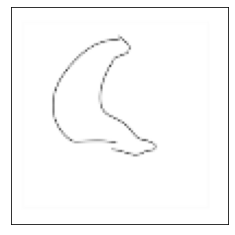

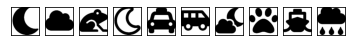

[[0.        8.212008  6.802378  ... 5.0552864 0.        0.2492979]
 [0.        8.212008  6.802378  ... 5.0552864 0.        0.2492979]
 [0.        8.212008  6.802378  ... 5.0552864 0.        0.2492979]
 ...
 [0.        8.212008  6.802378  ... 5.0552864 0.        0.2492979]
 [0.        8.212008  6.802378  ... 5.0552864 0.        0.2492979]
 [0.        8.212008  6.802378  ... 5.0552864 0.        0.2492979]]


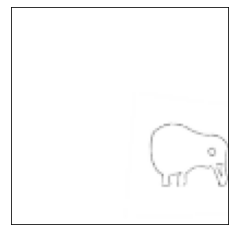

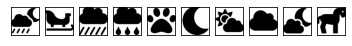

[[0.         8.494133   9.379895   ... 1.7057556  0.71742344 0.        ]
 [0.         8.494133   9.379895   ... 1.7057556  0.71742344 0.        ]
 [0.         8.494133   9.379895   ... 1.7057556  0.71742344 0.        ]
 ...
 [0.         8.494133   9.379895   ... 1.7057556  0.71742344 0.        ]
 [0.         8.494133   9.379895   ... 1.7057556  0.71742344 0.        ]
 [0.         8.494133   9.379895   ... 1.7057556  0.71742344 0.        ]]


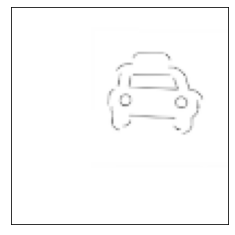

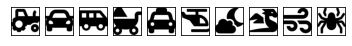

[[ 0.         4.8485947  1.9076893 ...  1.6938524 18.797062  15.415956 ]
 [ 0.         4.8485947  1.9076893 ...  1.6938524 18.797062  15.415956 ]
 [ 0.         4.8485947  1.9076893 ...  1.6938524 18.797062  15.415956 ]
 ...
 [ 0.         4.8485947  1.9076893 ...  1.6938524 18.797062  15.415956 ]
 [ 0.         4.8485947  1.9076893 ...  1.6938524 18.797062  15.415956 ]
 [ 0.         4.8485947  1.9076893 ...  1.6938524 18.797062  15.415956 ]]


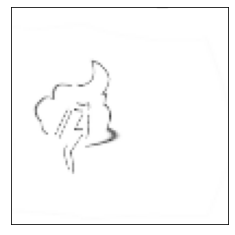

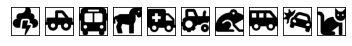

[[0.         0.20512703 5.576489   ... 9.833783   5.946583   2.8059623 ]
 [0.         0.20512703 5.576489   ... 9.833783   5.946583   2.8059623 ]
 [0.         0.20512703 5.576489   ... 9.833783   5.946583   2.8059623 ]
 ...
 [0.         0.20512703 5.576489   ... 9.833783   5.946583   2.8059623 ]
 [0.         0.20512703 5.576489   ... 9.833783   5.946583   2.8059623 ]
 [0.         0.20512703 5.576489   ... 9.833783   5.946583   2.8059623 ]]


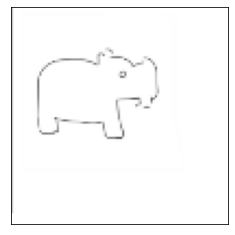

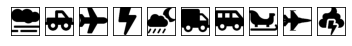

[[0.        1.7880026 3.3481936 ... 0.        0.        0.       ]
 [0.        1.7880026 3.3481936 ... 0.        0.        0.       ]
 [0.        1.7880026 3.3481936 ... 0.        0.        0.       ]
 ...
 [0.        1.7880026 3.3481936 ... 0.        0.        0.       ]
 [0.        1.7880026 3.3481936 ... 0.        0.        0.       ]
 [0.        1.7880026 3.3481936 ... 0.        0.        0.       ]]


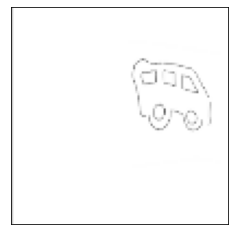

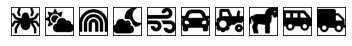

[[ 0.        12.919464   1.1298335 ...  8.187097   0.         0.4877464]
 [ 0.        12.919464   1.1298335 ...  8.187097   0.         0.4877464]
 [ 0.        12.919464   1.1298335 ...  8.187097   0.         0.4877464]
 ...
 [ 0.        12.919464   1.1298335 ...  8.187097   0.         0.4877464]
 [ 0.        12.919464   1.1298335 ...  8.187097   0.         0.4877464]
 [ 0.        12.919464   1.1298335 ...  8.187097   0.         0.4877464]]


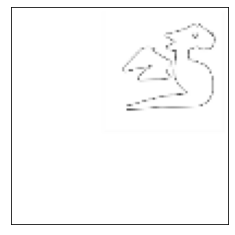

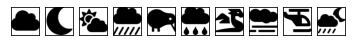

[[16.600698    0.          0.         ...  4.85741     0.30107152
   5.90919   ]
 [16.600698    0.          0.         ...  4.85741     0.30107152
   5.90919   ]
 [16.600698    0.          0.         ...  4.85741     0.30107152
   5.90919   ]
 ...
 [16.600698    0.          0.         ...  4.85741     0.30107152
   5.90919   ]
 [16.600698    0.          0.         ...  4.85741     0.30107152
   5.90919   ]
 [16.600698    0.          0.         ...  4.85741     0.30107152
   5.90919   ]]


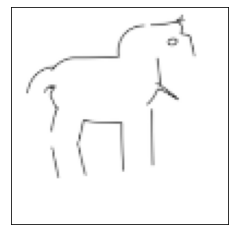

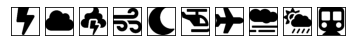

[[14.231706   5.9026165  3.66377   ...  0.         0.         6.6757994]
 [14.231706   5.9026165  3.66377   ...  0.         0.         6.6757994]
 [14.231706   5.9026165  3.66377   ...  0.         0.         6.6757994]
 ...
 [14.231706   5.9026165  3.66377   ...  0.         0.         6.6757994]
 [14.231706   5.9026165  3.66377   ...  0.         0.         6.6757994]
 [14.231706   5.9026165  3.66377   ...  0.         0.         6.6757994]]


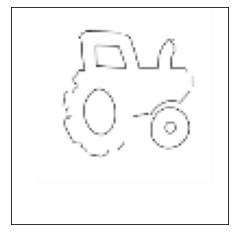

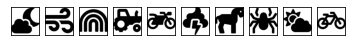

[[ 1.3560947  4.2974215 10.398249  ...  5.607489   0.         0.       ]
 [ 1.3560947  4.2974215 10.398249  ...  5.607489   0.         0.       ]
 [ 1.3560947  4.2974215 10.398249  ...  5.607489   0.         0.       ]
 ...
 [ 1.3560947  4.2974215 10.398249  ...  5.607489   0.         0.       ]
 [ 1.3560947  4.2974215 10.398249  ...  5.607489   0.         0.       ]
 [ 1.3560947  4.2974215 10.398249  ...  5.607489   0.         0.       ]]


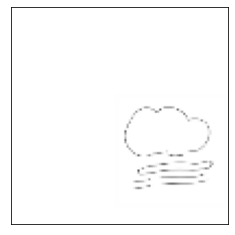

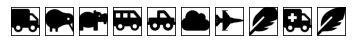

[[ 1.5224849 15.391411   2.9236805 ...  0.         0.         0.       ]
 [ 1.5224849 15.391411   2.9236805 ...  0.         0.         0.       ]
 [ 1.5224849 15.391411   2.9236805 ...  0.         0.         0.       ]
 ...
 [ 1.5224849 15.391411   2.9236805 ...  0.         0.         0.       ]
 [ 1.5224849 15.391411   2.9236805 ...  0.         0.         0.       ]
 [ 1.5224849 15.391411   2.9236805 ...  0.         0.         0.       ]]


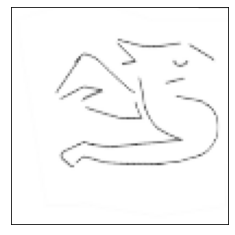

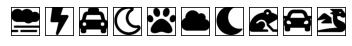

[[ 1.3077585  22.177004    0.         ... 13.85067     0.
   0.15706699]
 [ 1.3077585  22.177004    0.         ... 13.85067     0.
   0.15706699]
 [ 1.3077585  22.177004    0.         ... 13.85067     0.
   0.15706699]
 ...
 [ 1.3077585  22.177004    0.         ... 13.85067     0.
   0.15706699]
 [ 1.3077585  22.177004    0.         ... 13.85067     0.
   0.15706699]
 [ 1.3077585  22.177004    0.         ... 13.85067     0.
   0.15706699]]


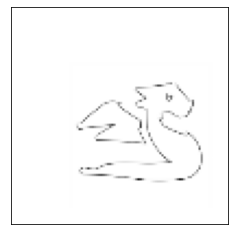

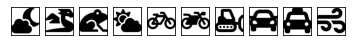

[[ 0.       12.907953 12.79026  ...  0.        5.253181 10.83973 ]
 [ 0.       12.907953 12.79026  ...  0.        5.253181 10.83973 ]
 [ 0.       12.907953 12.79026  ...  0.        5.253181 10.83973 ]
 ...
 [ 0.       12.907953 12.79026  ...  0.        5.253181 10.83973 ]
 [ 0.       12.907953 12.79026  ...  0.        5.253181 10.83973 ]
 [ 0.       12.907953 12.79026  ...  0.        5.253181 10.83973 ]]


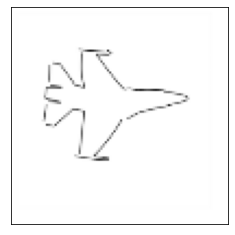

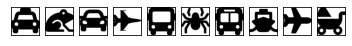

[[ 4.264578   3.162869   6.6374054 ...  7.3160853  6.00793   19.38396  ]
 [ 4.264578   3.162869   6.6374054 ...  7.3160853  6.00793   19.38396  ]
 [ 4.264578   3.162869   6.6374054 ...  7.3160853  6.00793   19.38396  ]
 ...
 [ 4.264578   3.162869   6.6374054 ...  7.3160853  6.00793   19.38396  ]
 [ 4.264578   3.162869   6.6374054 ...  7.3160853  6.00793   19.38396  ]
 [ 4.264578   3.162869   6.6374054 ...  7.3160853  6.00793   19.38396  ]]


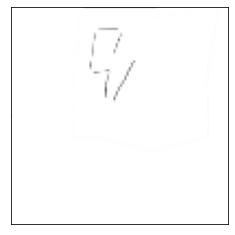

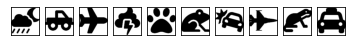

[[12.33282    9.975003   0.8302286 ...  1.6146     0.         0.       ]
 [12.33282    9.975003   0.8302286 ...  1.6146     0.         0.       ]
 [12.33282    9.975003   0.8302286 ...  1.6146     0.         0.       ]
 ...
 [12.33282    9.975003   0.8302286 ...  1.6146     0.         0.       ]
 [12.33282    9.975003   0.8302286 ...  1.6146     0.         0.       ]
 [12.33282    9.975003   0.8302286 ...  1.6146     0.         0.       ]]


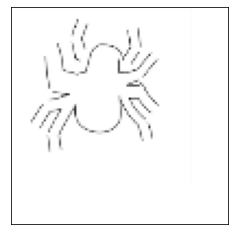

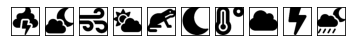

[[ 3.433764   0.        12.193422  ... 13.576659   1.7027309  8.51392  ]
 [ 3.433764   0.        12.193422  ... 13.576659   1.7027309  8.51392  ]
 [ 3.433764   0.        12.193422  ... 13.576659   1.7027309  8.51392  ]
 ...
 [ 3.433764   0.        12.193422  ... 13.576659   1.7027309  8.51392  ]
 [ 3.433764   0.        12.193422  ... 13.576659   1.7027309  8.51392  ]
 [ 3.433764   0.        12.193422  ... 13.576659   1.7027309  8.51392  ]]


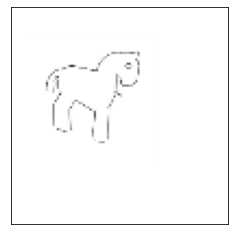

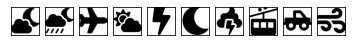

[[ 0.         0.        21.846027  ...  0.         2.7243361  4.66176  ]
 [ 0.         0.        21.846027  ...  0.         2.7243361  4.66176  ]
 [ 0.         0.        21.846027  ...  0.         2.7243361  4.66176  ]
 ...
 [ 0.         0.        21.846027  ...  0.         2.7243361  4.66176  ]
 [ 0.         0.        21.846027  ...  0.         2.7243361  4.66176  ]
 [ 0.         0.        21.846027  ...  0.         2.7243361  4.66176  ]]


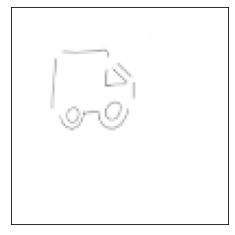

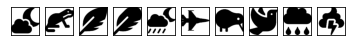

[[ 0.         0.        11.292362  ...  0.         3.5839915  1.2491361]
 [ 0.         0.        11.292362  ...  0.         3.5839915  1.2491361]
 [ 0.         0.        11.292362  ...  0.         3.5839915  1.2491361]
 ...
 [ 0.         0.        11.292362  ...  0.         3.5839915  1.2491361]
 [ 0.         0.        11.292362  ...  0.         3.5839915  1.2491361]
 [ 0.         0.        11.292362  ...  0.         3.5839915  1.2491361]]


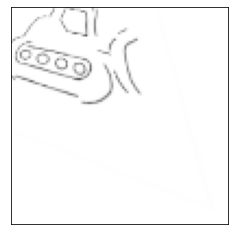

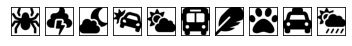

[[0.       9.044346 0.       ... 0.       0.       0.      ]
 [0.       9.044346 0.       ... 0.       0.       0.      ]
 [0.       9.044346 0.       ... 0.       0.       0.      ]
 ...
 [0.       9.044346 0.       ... 0.       0.       0.      ]
 [0.       9.044346 0.       ... 0.       0.       0.      ]
 [0.       9.044346 0.       ... 0.       0.       0.      ]]


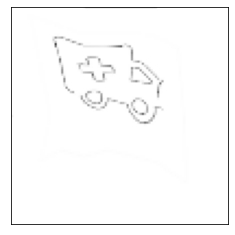

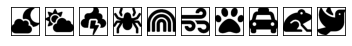

[[ 0.          1.2559135   2.4435756  ...  2.8837855   0.52618456
  12.361465  ]
 [ 0.          1.2559135   2.4435756  ...  2.8837855   0.52618456
  12.361465  ]
 [ 0.          1.2559135   2.4435756  ...  2.8837855   0.52618456
  12.361465  ]
 ...
 [ 0.          1.2559135   2.4435756  ...  2.8837855   0.52618456
  12.361465  ]
 [ 0.          1.2559135   2.4435756  ...  2.8837855   0.52618456
  12.361465  ]
 [ 0.          1.2559135   2.4435756  ...  2.8837855   0.52618456
  12.361465  ]]


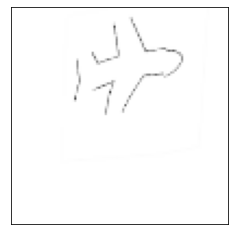

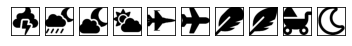

[[ 2.3126612  17.213806    0.11044054 ...  0.         29.079294
  21.598654  ]
 [ 2.3126612  17.213806    0.11044054 ...  0.         29.079294
  21.598654  ]
 [ 2.3126612  17.213806    0.11044054 ...  0.         29.079294
  21.598654  ]
 ...
 [ 2.3126612  17.213806    0.11044054 ...  0.         29.079294
  21.598654  ]
 [ 2.3126612  17.213806    0.11044054 ...  0.         29.079294
  21.598654  ]
 [ 2.3126612  17.213806    0.11044054 ...  0.         29.079294
  21.598654  ]]


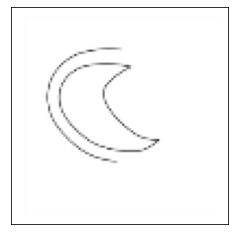

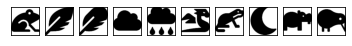

[[10.481821    9.613709    8.984016   ...  0.          0.
   0.16657321]
 [10.481821    9.613709    8.984016   ...  0.          0.
   0.16657321]
 [10.481821    9.613709    8.984016   ...  0.          0.
   0.16657321]
 ...
 [10.481821    9.613709    8.984016   ...  0.          0.
   0.16657321]
 [10.481821    9.613709    8.984016   ...  0.          0.
   0.16657321]
 [10.481821    9.613709    8.984016   ...  0.          0.
   0.16657321]]


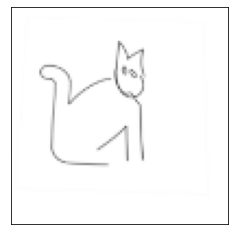

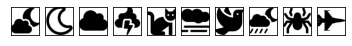

[[ 0.       14.603004 11.439144 ...  0.       10.812159  0.      ]
 [ 0.       14.603004 11.439144 ...  0.       10.812159  0.      ]
 [ 0.       14.603004 11.439144 ...  0.       10.812159  0.      ]
 ...
 [ 0.       14.603004 11.439144 ...  0.       10.812159  0.      ]
 [ 0.       14.603004 11.439144 ...  0.       10.812159  0.      ]
 [ 0.       14.603004 11.439144 ...  0.       10.812159  0.      ]]


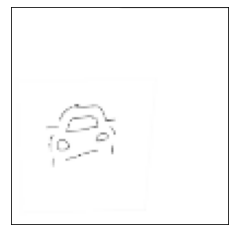

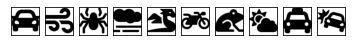

[[ 0.       16.500626 16.009829 ...  0.        0.       10.21696 ]
 [ 0.       16.500626 16.009829 ...  0.        0.       10.21696 ]
 [ 0.       16.500626 16.009829 ...  0.        0.       10.21696 ]
 ...
 [ 0.       16.500626 16.009829 ...  0.        0.       10.21696 ]
 [ 0.       16.500626 16.009829 ...  0.        0.       10.21696 ]
 [ 0.       16.500626 16.009829 ...  0.        0.       10.21696 ]]


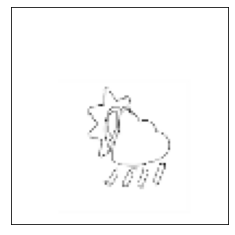

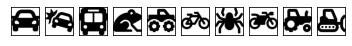

[[0.        0.        0.        ... 0.        5.9111686 0.       ]
 [0.        0.        0.        ... 0.        5.9111686 0.       ]
 [0.        0.        0.        ... 0.        5.9111686 0.       ]
 ...
 [0.        0.        0.        ... 0.        5.9111686 0.       ]
 [0.        0.        0.        ... 0.        5.9111686 0.       ]
 [0.        0.        0.        ... 0.        5.9111686 0.       ]]


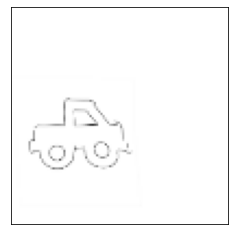

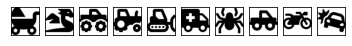

[[ 0.23607406 16.961586   11.227277   ... 13.556772    0.
  11.909057  ]
 [ 0.23607406 16.961586   11.227277   ... 13.556772    0.
  11.909057  ]
 [ 0.23607406 16.961586   11.227277   ... 13.556772    0.
  11.909057  ]
 ...
 [ 0.23607406 16.961586   11.227277   ... 13.556772    0.
  11.909057  ]
 [ 0.23607406 16.961586   11.227277   ... 13.556772    0.
  11.909057  ]
 [ 0.23607406 16.961586   11.227277   ... 13.556772    0.
  11.909057  ]]


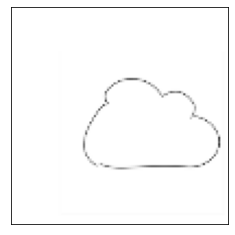

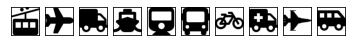

[[ 1.6520227  7.988903  15.911591  ...  0.         0.         7.41357  ]
 [ 1.6520227  7.988903  15.911591  ...  0.         0.         7.41357  ]
 [ 1.6520227  7.988903  15.911591  ...  0.         0.         7.41357  ]
 ...
 [ 1.6520227  7.988903  15.911591  ...  0.         0.         7.41357  ]
 [ 1.6520227  7.988903  15.911591  ...  0.         0.         7.41357  ]
 [ 1.6520227  7.988903  15.911591  ...  0.         0.         7.41357  ]]


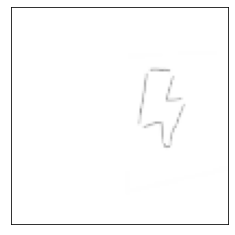

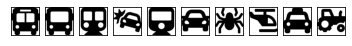

[[ 0.43964872  6.405835   15.373803   ... 20.815437   14.537893
  13.421386  ]
 [ 0.43964872  6.405835   15.373803   ... 20.815437   14.537893
  13.421386  ]
 [ 0.43964872  6.405835   15.373803   ... 20.815437   14.537893
  13.421386  ]
 ...
 [ 0.43964872  6.405835   15.373803   ... 20.815437   14.537893
  13.421386  ]
 [ 0.43964872  6.405835   15.373803   ... 20.815437   14.537893
  13.421386  ]
 [ 0.43964872  6.405835   15.373803   ... 20.815437   14.537893
  13.421386  ]]


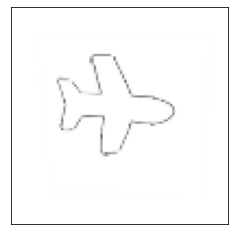

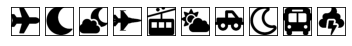

[[5.9519835 9.567419  2.1070764 ... 0.        0.        0.       ]
 [5.9519835 9.567419  2.1070764 ... 0.        0.        0.       ]
 [5.9519835 9.567419  2.1070764 ... 0.        0.        0.       ]
 ...
 [5.9519835 9.567419  2.1070764 ... 0.        0.        0.       ]
 [5.9519835 9.567419  2.1070764 ... 0.        0.        0.       ]
 [5.9519835 9.567419  2.1070764 ... 0.        0.        0.       ]]


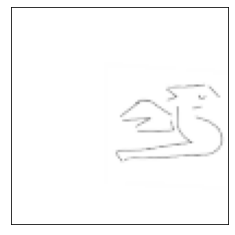

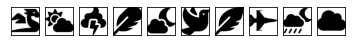

[[1.997554  8.3953495 5.908021  ... 0.        0.        0.       ]
 [1.997554  8.3953495 5.908021  ... 0.        0.        0.       ]
 [1.997554  8.3953495 5.908021  ... 0.        0.        0.       ]
 ...
 [1.997554  8.3953495 5.908021  ... 0.        0.        0.       ]
 [1.997554  8.3953495 5.908021  ... 0.        0.        0.       ]
 [1.997554  8.3953495 5.908021  ... 0.        0.        0.       ]]


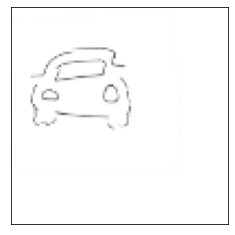

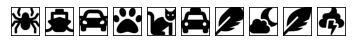

[[ 0.5052694  6.272135  12.429913  ...  0.         3.6490178  6.611508 ]
 [ 0.5052694  6.272135  12.429913  ...  0.         3.6490178  6.611508 ]
 [ 0.5052694  6.272135  12.429913  ...  0.         3.6490178  6.611508 ]
 ...
 [ 0.5052694  6.272135  12.429913  ...  0.         3.6490178  6.611508 ]
 [ 0.5052694  6.272135  12.429913  ...  0.         3.6490178  6.611508 ]
 [ 0.5052694  6.272135  12.429913  ...  0.         3.6490178  6.611508 ]]


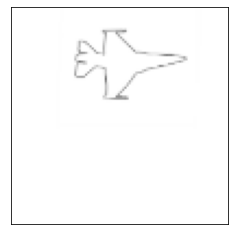

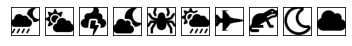

[[ 0.        8.303891  9.260897 ... 11.209403 13.802555 15.890243]
 [ 0.        8.303891  9.260897 ... 11.209403 13.802555 15.890243]
 [ 0.        8.303891  9.260897 ... 11.209403 13.802555 15.890243]
 ...
 [ 0.        8.303891  9.260897 ... 11.209403 13.802555 15.890243]
 [ 0.        8.303891  9.260897 ... 11.209403 13.802555 15.890243]
 [ 0.        8.303891  9.260897 ... 11.209403 13.802555 15.890243]]


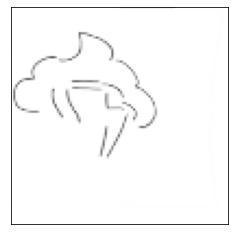

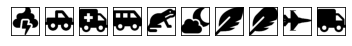

[[ 0.        0.       21.328579 ...  0.        0.        0.      ]
 [ 0.        0.       21.328579 ...  0.        0.        0.      ]
 [ 0.        0.       21.328579 ...  0.        0.        0.      ]
 ...
 [ 0.        0.       21.328579 ...  0.        0.        0.      ]
 [ 0.        0.       21.328579 ...  0.        0.        0.      ]
 [ 0.        0.       21.328579 ...  0.        0.        0.      ]]


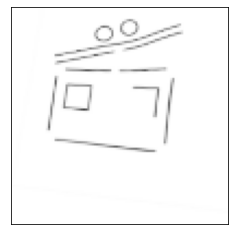

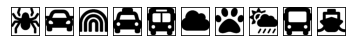

[[ 0.         33.34958     0.         ... 16.587824    0.
   0.07952802]
 [ 0.         33.34958     0.         ... 16.587824    0.
   0.07952802]
 [ 0.         33.34958     0.         ... 16.587824    0.
   0.07952802]
 ...
 [ 0.         33.34958     0.         ... 16.587824    0.
   0.07952802]
 [ 0.         33.34958     0.         ... 16.587824    0.
   0.07952802]
 [ 0.         33.34958     0.         ... 16.587824    0.
   0.07952802]]


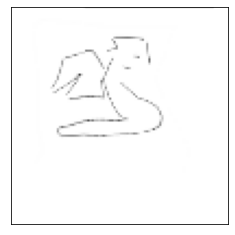

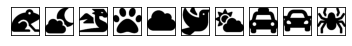

[[ 1.9058282  0.         2.0837967 ... 16.398525   0.         0.3633043]
 [ 1.9058282  0.         2.0837967 ... 16.398525   0.         0.3633043]
 [ 1.9058282  0.         2.0837967 ... 16.398525   0.         0.3633043]
 ...
 [ 1.9058282  0.         2.0837967 ... 16.398525   0.         0.3633043]
 [ 1.9058282  0.         2.0837967 ... 16.398525   0.         0.3633043]
 [ 1.9058282  0.         2.0837967 ... 16.398525   0.         0.3633043]]


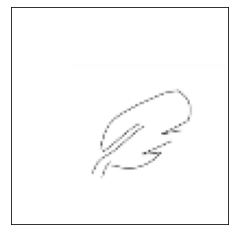

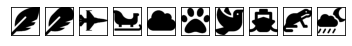

[[ 0.         5.5078254  0.        ... 12.053618   2.9663732 19.148668 ]
 [ 0.         5.5078254  0.        ... 12.053618   2.9663732 19.148668 ]
 [ 0.         5.5078254  0.        ... 12.053618   2.9663732 19.148668 ]
 ...
 [ 0.         5.5078254  0.        ... 12.053618   2.9663732 19.148668 ]
 [ 0.         5.5078254  0.        ... 12.053618   2.9663732 19.148668 ]
 [ 0.         5.5078254  0.        ... 12.053618   2.9663732 19.148668 ]]


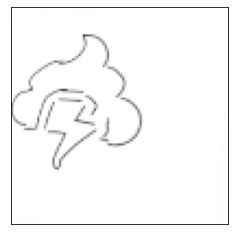

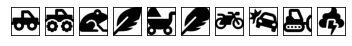

[[0.        7.0199537 6.7215633 ... 5.229621  9.362133  2.4386446]
 [0.        7.0199537 6.7215633 ... 5.229621  9.362133  2.4386446]
 [0.        7.0199537 6.7215633 ... 5.229621  9.362133  2.4386446]
 ...
 [0.        7.0199537 6.7215633 ... 5.229621  9.362133  2.4386446]
 [0.        7.0199537 6.7215633 ... 5.229621  9.362133  2.4386446]
 [0.        7.0199537 6.7215633 ... 5.229621  9.362133  2.4386446]]


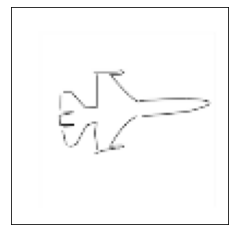

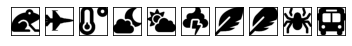

[[ 0.         5.305112  17.351616  ...  0.         4.8765273  0.       ]
 [ 0.         5.305112  17.351616  ...  0.         4.8765273  0.       ]
 [ 0.         5.305112  17.351616  ...  0.         4.8765273  0.       ]
 ...
 [ 0.         5.305112  17.351616  ...  0.         4.8765273  0.       ]
 [ 0.         5.305112  17.351616  ...  0.         4.8765273  0.       ]
 [ 0.         5.305112  17.351616  ...  0.         4.8765273  0.       ]]


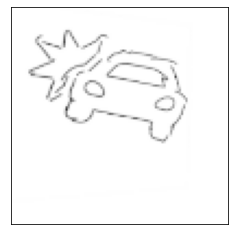

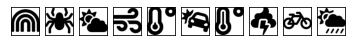

[[ 2.1496725 13.386925   0.        ...  0.         0.         0.       ]
 [ 2.1496725 13.386925   0.        ...  0.         0.         0.       ]
 [ 2.1496725 13.386925   0.        ...  0.         0.         0.       ]
 ...
 [ 2.1496725 13.386925   0.        ...  0.         0.         0.       ]
 [ 2.1496725 13.386925   0.        ...  0.         0.         0.       ]
 [ 2.1496725 13.386925   0.        ...  0.         0.         0.       ]]


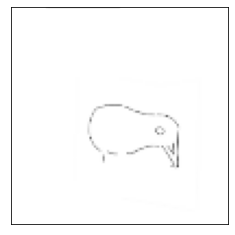

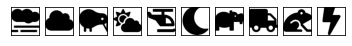

[[0.        7.1453857 2.6877794 ... 0.        3.2160873 0.9942903]
 [0.        7.1453857 2.6877794 ... 0.        3.2160873 0.9942903]
 [0.        7.1453857 2.6877794 ... 0.        3.2160873 0.9942903]
 ...
 [0.        7.1453857 2.6877794 ... 0.        3.2160873 0.9942903]
 [0.        7.1453857 2.6877794 ... 0.        3.2160873 0.9942903]
 [0.        7.1453857 2.6877794 ... 0.        3.2160873 0.9942903]]


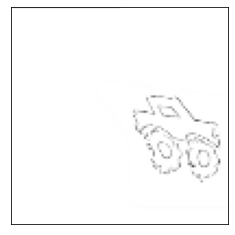

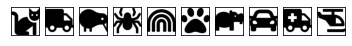

[[ 0.        30.235928   7.9162984 ...  0.        20.055975  11.779418 ]
 [ 0.        30.235928   7.9162984 ...  0.        20.055975  11.779418 ]
 [ 0.        30.235928   7.9162984 ...  0.        20.055975  11.779418 ]
 ...
 [ 0.        30.235928   7.9162984 ...  0.        20.055975  11.779418 ]
 [ 0.        30.235928   7.9162984 ...  0.        20.055975  11.779418 ]
 [ 0.        30.235928   7.9162984 ...  0.        20.055975  11.779418 ]]


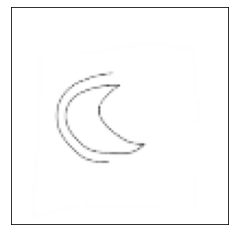

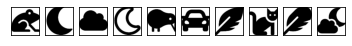

[[ 0.         5.336207   0.        ... 15.114866   0.         0.8254886]
 [ 0.         5.336207   0.        ... 15.114866   0.         0.8254886]
 [ 0.         5.336207   0.        ... 15.114866   0.         0.8254886]
 ...
 [ 0.         5.336207   0.        ... 15.114866   0.         0.8254886]
 [ 0.         5.336207   0.        ... 15.114866   0.         0.8254886]
 [ 0.         5.336207   0.        ... 15.114866   0.         0.8254886]]


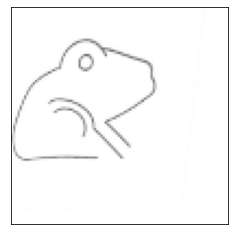

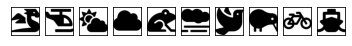

[[ 1.8878388  0.        13.193432  ...  0.         0.         0.       ]
 [ 1.8878388  0.        13.193432  ...  0.         0.         0.       ]
 [ 1.8878388  0.        13.193432  ...  0.         0.         0.       ]
 ...
 [ 1.8878388  0.        13.193432  ...  0.         0.         0.       ]
 [ 1.8878388  0.        13.193432  ...  0.         0.         0.       ]
 [ 1.8878388  0.        13.193432  ...  0.         0.         0.       ]]


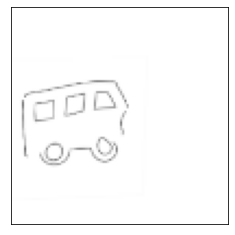

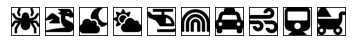

[[ 0.         6.0417604  5.6847167 ... 10.992579   0.         1.1474041]
 [ 0.         6.0417604  5.6847167 ... 10.992579   0.         1.1474041]
 [ 0.         6.0417604  5.6847167 ... 10.992579   0.         1.1474041]
 ...
 [ 0.         6.0417604  5.6847167 ... 10.992579   0.         1.1474041]
 [ 0.         6.0417604  5.6847167 ... 10.992579   0.         1.1474041]
 [ 0.         6.0417604  5.6847167 ... 10.992579   0.         1.1474041]]


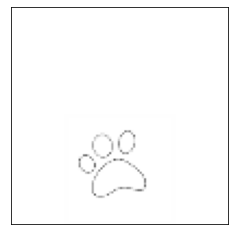

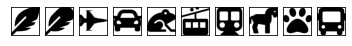

[[17.230883   0.         0.6006568 ...  0.        10.613397   3.8712642]
 [17.230883   0.         0.6006568 ...  0.        10.613397   3.8712642]
 [17.230883   0.         0.6006568 ...  0.        10.613397   3.8712642]
 ...
 [17.230883   0.         0.6006568 ...  0.        10.613397   3.8712642]
 [17.230883   0.         0.6006568 ...  0.        10.613397   3.8712642]
 [17.230883   0.         0.6006568 ...  0.        10.613397   3.8712642]]


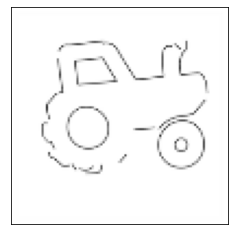

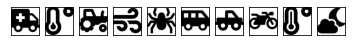

[[1.7233983 0.        0.        ... 0.        0.        1.1231173]
 [1.7233983 0.        0.        ... 0.        0.        1.1231173]
 [1.7233983 0.        0.        ... 0.        0.        1.1231173]
 ...
 [1.7233983 0.        0.        ... 0.        0.        1.1231173]
 [1.7233983 0.        0.        ... 0.        0.        1.1231173]
 [1.7233983 0.        0.        ... 0.        0.        1.1231173]]


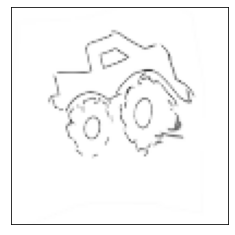

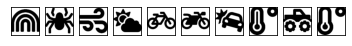

[[ 0.        16.674343   0.        ... 11.301586  22.171236   6.6883435]
 [ 0.        16.674343   0.        ... 11.301586  22.171236   6.6883435]
 [ 0.        16.674343   0.        ... 11.301586  22.171236   6.6883435]
 ...
 [ 0.        16.674343   0.        ... 11.301586  22.171236   6.6883435]
 [ 0.        16.674343   0.        ... 11.301586  22.171236   6.6883435]
 [ 0.        16.674343   0.        ... 11.301586  22.171236   6.6883435]]


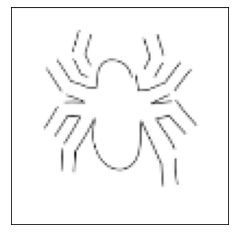

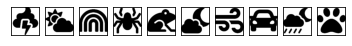

[[ 0.         6.13542    8.383408  ... 26.824305   0.         4.8815475]
 [ 0.         6.13542    8.383408  ... 26.824305   0.         4.8815475]
 [ 0.         6.13542    8.383408  ... 26.824305   0.         4.8815475]
 ...
 [ 0.         6.13542    8.383408  ... 26.824305   0.         4.8815475]
 [ 0.         6.13542    8.383408  ... 26.824305   0.         4.8815475]
 [ 0.         6.13542    8.383408  ... 26.824305   0.         4.8815475]]


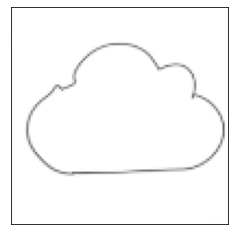

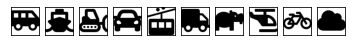

[[ 2.68769    3.7869606 11.815939  ...  0.         0.         6.3650794]
 [ 2.68769    3.7869606 11.815939  ...  0.         0.         6.3650794]
 [ 2.68769    3.7869606 11.815939  ...  0.         0.         6.3650794]
 ...
 [ 2.68769    3.7869606 11.815939  ...  0.         0.         6.3650794]
 [ 2.68769    3.7869606 11.815939  ...  0.         0.         6.3650794]
 [ 2.68769    3.7869606 11.815939  ...  0.         0.         6.3650794]]


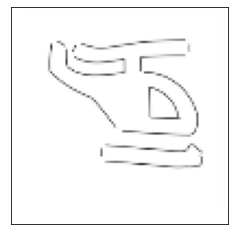

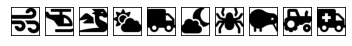

[[ 0.         3.6444957 11.310696  ... 22.087736  12.387563  13.021605 ]
 [ 0.         3.6444957 11.310696  ... 22.087736  12.387563  13.021605 ]
 [ 0.         3.6444957 11.310696  ... 22.087736  12.387563  13.021605 ]
 ...
 [ 0.         3.6444957 11.310696  ... 22.087736  12.387563  13.021605 ]
 [ 0.         3.6444957 11.310696  ... 22.087736  12.387563  13.021605 ]
 [ 0.         3.6444957 11.310696  ... 22.087736  12.387563  13.021605 ]]


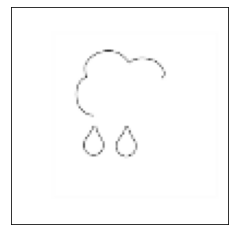

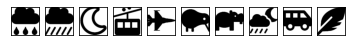

[[11.34977    0.         3.1759405 ...  8.566297   8.809303   0.3260328]
 [11.34977    0.         3.1759405 ...  8.566297   8.809303   0.3260328]
 [11.34977    0.         3.1759405 ...  8.566297   8.809303   0.3260328]
 ...
 [11.34977    0.         3.1759405 ...  8.566297   8.809303   0.3260328]
 [11.34977    0.         3.1759405 ...  8.566297   8.809303   0.3260328]
 [11.34977    0.         3.1759405 ...  8.566297   8.809303   0.3260328]]


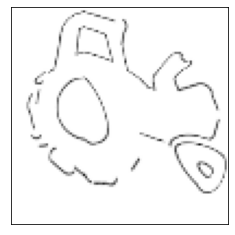

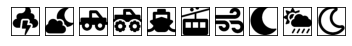

[[13.846723  14.551648   1.7061236 ...  0.         0.         0.       ]
 [13.846723  14.551648   1.7061236 ...  0.         0.         0.       ]
 [13.846723  14.551648   1.7061236 ...  0.         0.         0.       ]
 ...
 [13.846723  14.551648   1.7061236 ...  0.         0.         0.       ]
 [13.846723  14.551648   1.7061236 ...  0.         0.         0.       ]
 [13.846723  14.551648   1.7061236 ...  0.         0.         0.       ]]


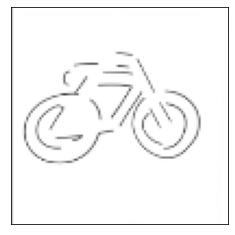

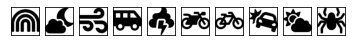

[[0.       0.       0.       ... 2.557571 6.369062 6.38869 ]
 [0.       0.       0.       ... 2.557571 6.369062 6.38869 ]
 [0.       0.       0.       ... 2.557571 6.369062 6.38869 ]
 ...
 [0.       0.       0.       ... 2.557571 6.369062 6.38869 ]
 [0.       0.       0.       ... 2.557571 6.369062 6.38869 ]
 [0.       0.       0.       ... 2.557571 6.369062 6.38869 ]]


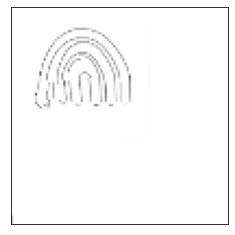

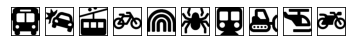

[[ 0.         7.2939105 15.882053  ...  3.9195688  0.        14.222252 ]
 [ 0.         7.2939105 15.882053  ...  3.9195688  0.        14.222252 ]
 [ 0.         7.2939105 15.882053  ...  3.9195688  0.        14.222252 ]
 ...
 [ 0.         7.2939105 15.882053  ...  3.9195688  0.        14.222252 ]
 [ 0.         7.2939105 15.882053  ...  3.9195688  0.        14.222252 ]
 [ 0.         7.2939105 15.882053  ...  3.9195688  0.        14.222252 ]]


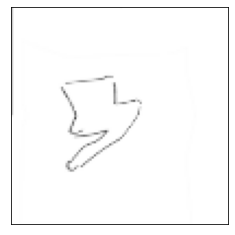

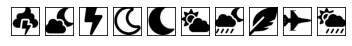

[[ 0.        10.518434  17.346375  ...  1.8569243 17.532429  21.738882 ]
 [ 0.        10.518434  17.346375  ...  1.8569243 17.532429  21.738882 ]
 [ 0.        10.518434  17.346375  ...  1.8569243 17.532429  21.738882 ]
 ...
 [ 0.        10.518434  17.346375  ...  1.8569243 17.532429  21.738882 ]
 [ 0.        10.518434  17.346375  ...  1.8569243 17.532429  21.738882 ]
 [ 0.        10.518434  17.346375  ...  1.8569243 17.532429  21.738882 ]]


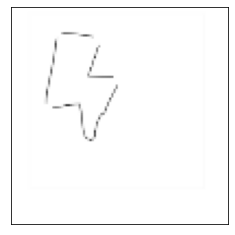

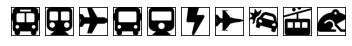

[[ 0.        12.871802   9.3481    ... 13.972497   9.761927   5.6188235]
 [ 0.        12.871802   9.3481    ... 13.972497   9.761927   5.6188235]
 [ 0.        12.871802   9.3481    ... 13.972497   9.761927   5.6188235]
 ...
 [ 0.        12.871802   9.3481    ... 13.972497   9.761927   5.6188235]
 [ 0.        12.871802   9.3481    ... 13.972497   9.761927   5.6188235]
 [ 0.        12.871802   9.3481    ... 13.972497   9.761927   5.6188235]]


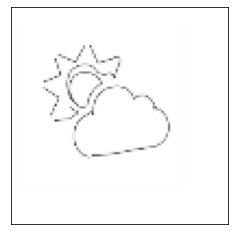

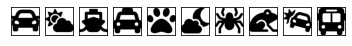

[[0.        5.1708345 3.2275221 ... 0.        0.        0.       ]
 [0.        5.1708345 3.2275221 ... 0.        0.        0.       ]
 [0.        5.1708345 3.2275221 ... 0.        0.        0.       ]
 ...
 [0.        5.1708345 3.2275221 ... 0.        0.        0.       ]
 [0.        5.1708345 3.2275221 ... 0.        0.        0.       ]
 [0.        5.1708345 3.2275221 ... 0.        0.        0.       ]]


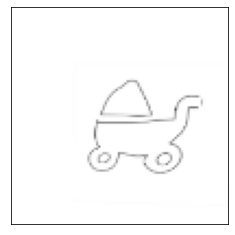

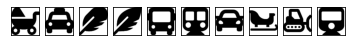

Accuracy of top 1: 0.14189189189189189
Accuracy of top 10: 0.6621621621621622


In [7]:
if epoch%1==0:
    acc_1 = 0
    acc_10 = 0
    sketch_representations = []
    for j in range(0, len(sketches_Test), BATCH_SIZE):
        batch_sketches = sketches_Test[j:j+BATCH_SIZE]
        sketches_array = get_batch_sketches(batch_sketches)
        sketch_repr,_ =  sketchClassificationModel(sketches_array, training = False)
        sketch_representations.append(sketch_repr)
    sketch_representations = np.vstack(sketch_representations)
    
    icon_representations = []
    for j in range(0, len(unique_icons_Test), BATCH_SIZE):
        batch_icons = unique_icons_Test[j:j+BATCH_SIZE]
        icons_array = get_batch_icons(batch_icons)
        icons_repr,_ =  iconClassificationModel(icons_array, training = False)
        icon_representations.append(icons_repr)

    icon_representations = np.vstack(icon_representations)

    for k in range(len(sketch_representations)):
        sketch_repr = sketch_representations[k]
        sketch_representations_tile = np.tile(sketch_repr, len(unique_icons_Test)).reshape(len(unique_icons_Test), 64)
        diff = np.sqrt(np.mean((sketch_representations_tile - icon_representations)**2, -1))
        top_k = np.argsort(diff)[:10]
        print(sketch_representations_tile)
        img = sketch_dictionary[sketches_Test[k][0]]
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
        plt.show()
        
        
        for j in range(len(top_k)):
            index = top_k[j]
            if j == 0 and sketches_Test[k][0].split("_")[0] == unique_icons_Test[index][0].replace(".jpg",""):
                acc_1 = acc_1 + 1
                acc_10 = acc_10 + 1
                #break
            elif sketches_Test[k][0].split("_")[0] == unique_icons_Test[index][0].replace(".jpg",""):
                acc_10 = acc_10 + 1
                #break
            img = icon_dictionary[unique_icons_Test[index][0]]
            plt.subplot(1, 10, j+1)
            plt.imshow(img)
            plt.xticks([])
            plt.yticks([])
        plt.show()     
    print("Accuracy of top 1: " + str(acc_1/len(sketches_Test)))
    print("Accuracy of top 10: " + str(acc_10/len(sketches_Test)))

            

[['wind_9.png' 'weather' 'wind.jpg' 'weather' 'moon.jpg' 'weather']
 ['spider_24.png' 'animals' 'spider.jpg' 'animals' 'horse-head.jpg'
  'animals']
 ['truck-monster_23.png' 'vehicles' 'truck-monster.jpg' 'vehicles'
  'bicycle.jpg' 'vehicles']
 ...
 ['ship_10.png' 'vehicles' 'ship.jpg' 'vehicles' 'bus.jpg' 'vehicles']
 ['motorcycle_8.png' 'vehicles' 'motorcycle.jpg' 'vehicles'
  'helicopter.jpg' 'vehicles']
 ['shuttle-van_16.png' 'vehicles' 'shuttle-van.jpg' 'vehicles' 'car.jpg'
  'vehicles']]
